# ERA5 Circulation Regimes

# Import packages

In [112]:
%reload_ext autoreload

import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.path as mpath
import matplotlib.cm as cm
import matplotlib.patches as mpatches
from matplotlib.patches import Rectangle
import numpy as np
import pandas as pd
import scipy
import datetime
from collections import defaultdict
import cartopy
from metpy.units import units
import cartopy.crs as ccrs
import pickle
import os
import glob
import subprocess
import dask
from joblib import Parallel, delayed
from geopy.distance import distance  

import concurrent.futures


### Load MOAAP functions
import sys
sys.path.append('/work/aa0049/a271122/MOAAP/MOAAP/')
from src.utils import *
from src.Corrections import * 
from src.Enumerations import Month, Season, Experiments, Domains
from src.xarray_util import create_obj_from_dict,  ObjectContainer,  load_tracking_objects
from src.plot_funcs import plot_contourf_rotated_grid #, plot_unstructured_rotated_grid

from src.GridPoints import Domain



In [117]:
%reload_ext autoreload
### Load my functions
from ERA5_utils import *
from ERA5_circulation import *

In [7]:
dask.config.set(**{'array.slicing.split_large_chunks': True})

In [ ]:
def preprocess(ds):
    ds = ds.sel(lat=slice(30, None))
    ds = ds.sel(time=slice("1979-01-01", "2022-12-31"))
    return ds

# Load Objects

In [8]:
# Extract the rotated coordinate system from example file
ds=xr.open_dataset('/work/aa0049/a271041/spice-v2.1/chain/work/run_era5_polarres_wp3_hindcast2/post/yearly/T_2M/T_2M_2020010100-2020123123.ncz')

crs_rot = ccrs.RotatedPole(pole_longitude=ds.rotated_pole.attrs['grid_north_pole_longitude'],\
                           pole_latitude=ds.rotated_pole.attrs['grid_north_pole_latitude'])

In [9]:
#Load the objects in the Object container 1979-2022 
objs = load_tracking_objects(
         input_path = Experiments.ERA5.value.IVTobj_out_path,
         input_file_name_temp = 'MOAPP_ERA5_100and85ERA5perc_remapped_3x',
         type_ = 'IVT', 
         first_year = 1979,
         last_year  = 2022,
         load_clusters = True,
         load_coordinates=True,
         exp=Experiments.ERA5.value)

/work/aa0238/a271093/results/MOAAP/IVT_Tracking/ERA5_ICON_remapped_3x/Object_container_1979-2022_withClusters exists. Loading...


In [10]:
df_objs=define_df_objs(objs)

# Define custom sectors for selection

In [11]:
from enum import Enum

class Domains(Enum):
    NORTH_ATLANTIC_JLa = Domain(north=80, south=67, east=60, west=-30)
    BEAUFORT_SIBERIAN_JLa = Domain(north=80, south=70, east=-120, west=120)
    CENTRAL_ARCTIC_JLa = Domain(north=90, south=80, east=180, west=-180)

gridspacing=0.75
lat=np.arange(-90, 90+gridspacing,gridspacing)
lon=np.arange(-180, 180+gridspacing,gridspacing)
ds_dummy = xr.Dataset({"dummy": (("lat", "lon"), np.ones([len(lat), len(lon)]))},coords={"lon": lon,"lat": lat})


dd=ds_dummy.copy()
mask_domain_CentralArctic=dd.dummy.where(dd.lat>80).notnull()
mask_domain_NorthAtlantic=dd.dummy.where((dd.lat<=80) & (dd.lat>67) & (dd.lon>-30) & (dd.lon<60)).notnull()
mask_domain_BeaufortSiberianSea1=dd.dummy.where((dd.lat<=80) & (dd.lat>70) & (dd.lon>120)).notnull()
mask_domain_BeaufortSiberianSea2=dd.dummy.where((dd.lat<=80) & (dd.lat>70) & (dd.lon<-120)).notnull()

mask_domain_BeaufortSiberianSea = mask_domain_BeaufortSiberianSea1 | mask_domain_BeaufortSiberianSea2

mask_domains = {
    "CentralArctic": {"mask": mask_domain_CentralArctic, "color": 'darkred',"north":90,"south":80,"east":180,"west":-180},
    "NorthAtlantic": {"mask": mask_domain_NorthAtlantic, "color": 'darkblue',"north":80,"south":67,"east":60,"west":-30},
    "BeaufortSiberianSea": {"mask": mask_domain_BeaufortSiberianSea, "color": "gold","north":80,"south":70,"east":120,"west":-120},
}


mask_domain_Atlantic=dd.dummy.where((dd.lat<=90) & (dd.lat>45) & (dd.lon>-90) & (dd.lon<90)).notnull()
mask_domain_Pacific1=dd.dummy.where((dd.lat<=90) & (dd.lat>45) & (dd.lon>90)).notnull()
mask_domain_Pacific2=dd.dummy.where((dd.lat<=90) & (dd.lat>45) & (dd.lon<-90)).notnull()

mask_domain_Pacific = mask_domain_Pacific1 | mask_domain_Pacific2

mask_clusters = {
    "Atlantic": {"mask": mask_domain_Atlantic, "color": 'coral',"north":90,"south":45,"east":90,"west":-90},
    "Pacific": {"mask": mask_domain_Pacific, "color": "teal","north":90,"south":45,"east":-90,"west":90},
}

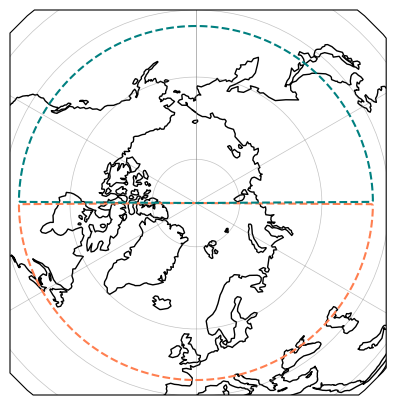

In [12]:
fig, ax = plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(5,5))
for domain_name, domain_data in mask_clusters.items():
    domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1.5,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())

ax.coastlines()
ax.set_extent([-180,180, 40, 90], crs=ccrs.PlateCarree())
ax.gridlines(linewidth=0.5,color='dimgray',alpha=0.4,zorder=2)#,draw_labels=True)


# Select Objects with respect to season and/or sector

In [13]:
objs_sel, ids_sel = sel_objs(objs,season='DJF')

In [19]:
len(objs_sel)

17

## Extract Rotated Coordinates and Transform Coordinates

In [20]:
objs_sel_tc = extract_and_transform_rot_coords(objs_sel)

## Only select objects that go from the Atlantic towards the Pacific region

In [21]:
objs_final = []
for nr in range(len(objs_sel)):
    NA_time=extract_domain_times(objs_sel[nr],80,67,60,-30)
    BS_time=extract_domain_times(objs_sel[nr],80,70,120,-120,True)
    CA_time=extract_domain_times(objs_sel[nr],90,80,180,-180)

    if NA_time[0] < BS_time[0] and NA_time[0] < CA_time[0]:
        objs_final.append(objs_sel[nr])

len(objs_final)

13

In [22]:
objs_final = objs_final[1:14]

## Select time chunks

In [31]:
#Select all dates in which an event appeared 
objs_times=[ds.times for ds in objs_final]

#Combine all dates in a data array 
objs_all_times = xr.concat(objs_times, dim='times').sortby('times').drop_duplicates(dim='times')

#Select all dates in which objects are in specific domains 
NA_combined_times, CA_combined_times, BS_combined_times,ATL_combined_times, PC_combined_times = combine_times_circ(objs_final)

In [32]:
month_day = get_month_day(objs_all_times)

In [33]:
track_times_pd = pd.to_datetime(NA_combined_times)
NA_month_day = list(set((time.month, time.day) for time in track_times_pd))

In [34]:
track_times_pd = pd.to_datetime(CA_combined_times)
CA_month_day = list(set((time.month, time.day) for time in track_times_pd))

In [35]:
track_times_pd = pd.to_datetime(BS_combined_times)
BS_month_day = list(set((time.month, time.day) for time in track_times_pd))

# Circulation Regimes

In [36]:
domain_hatch = {
    "NA": "---",   # Diagonal stripes
    "CA": "///",    # Vertical stripes
    "BS": "...",     # No pattern (solid fill)
    "NONE": ""   # Optional: Cross-hatch for no domain
}
domain_color = {"NA": "white", "CA": "white", "BS": "white", "NONE": "white"}


legend_patches = [
    mpatches.Patch(facecolor="lightgray", hatch=domain_hatch["NA"], label="North Atlantic"),
    mpatches.Patch(facecolor="lightgray", hatch=domain_hatch["CA"], label="Central Arctic"),
    mpatches.Patch(facecolor="lightgray", hatch=domain_hatch["BS"], label="Beaufort Sea"),
]

In [37]:
arctic_cluster_path = '/work/aa0049/a271122/ERA5/CirculationRegime_clusters/'

## 6h Atlantic Clusters

In [38]:
df_atlantic_clusters = xr.open_dataset('/work/aa0049/a271122/ERA5/CirculationRegime_clusters/KMEANSslp.4dx4dy_djf_aac_unnorm_5cluster_20PC_atlantic.nc')

In [39]:
df_atlantic_dates = pd.read_csv('/work/aa0049/a271122/ERA5/CirculationRegime_clusters/KMEANSslp.4dx4dy_djf_aac_unnorm_5cluster_20PC_dates_atlantic', sep=' ', header=0, names=['year', 'month', 'day','hour', 'cluster'])


In [40]:
df_atlantic_dates['date'] = pd.to_datetime(df_atlantic_dates[['year', 'month', 'day','hour']])

In [41]:
NA_bool = df_atlantic_dates['date'].isin(NA_combined_times)
CA_bool = df_atlantic_dates['date'].isin(CA_combined_times)
BS_bool = df_atlantic_dates['date'].isin(BS_combined_times)

In [42]:
#Create new column for the df_atlantic_dates dataframe which shows if at that time, an object (objs_final) is in a certain domain
NA_bool = df_atlantic_dates['date'].isin(NA_combined_times)
CA_bool = df_atlantic_dates['date'].isin(CA_combined_times)
BS_bool = df_atlantic_dates['date'].isin(BS_combined_times)
conditions = [NA_bool, CA_bool, BS_bool]
choices = ['NA', 'CA', 'BS']

df_atlantic_dates['domain'] = np.select(conditions, choices, default='NONE')
        

In [43]:
df_atlantic_dates

,year,month,day,hour,cluster,date,domain
0,1979,1,1,6,5,1979-01-01 06:00:00,NONE
1,1979,1,1,12,5,1979-01-01 12:00:00,NONE
2,1979,1,1,18,5,1979-01-01 18:00:00,NONE
3,1979,1,2,0,5,1979-01-02 00:00:00,NONE
4,1979,1,2,6,5,1979-01-02 06:00:00,NONE
...,...,...,...,...,...,...,...
15834,2022,12,30,18,3,2022-12-30 18:00:00,NONE
15835,2022,12,31,0,3,2022-12-31 00:00:00,NONE
15836,2022,12,31,6,3,2022-12-31 06:00:00,NONE
15837,2022,12,31,12,3,2022-12-31 12:00:00,NONE


In [44]:
#Create new column for the df_atlantic_dates dataframe which shows if at that time, an object (objs_final) is in a certain domain
NAO_plus_bool = df_atlantic_dates['cluster']==1
NAO_minus_bool = df_atlantic_dates['cluster']==4
ATL_bool = df_atlantic_dates['cluster']==3
SCAN_bool = df_atlantic_dates['cluster']==2
DP_bool = df_atlantic_dates['cluster']==5
conditions = [NAO_plus_bool,NAO_minus_bool,ATL_bool,SCAN_bool,DP_bool]
choices = ['WINTER-NAO+', 'WINTER-NAO-', 'WINTER-ATL-','WINTER-SCAN','WINTER-DIP']

df_atlantic_dates['cluster_names'] = np.select(conditions, choices, default='NONE')
        

In [45]:
#Define regime colors and images in dictionary
atlantic_regimes = {
    '1': {'name':'NAO+','color': '#FB9A99', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_1_upper_half_horizontal.png'},
    '2': {'name':'ScBl: Scandinavian Blocking','color': '#A6CEE3', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_2_upper_half_horizontal.png'},
    '3': {'name':'AT: Atlantic Trough','color': 'navy', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_3_upper_half_horizontal.png'},
    '4': {'name':'NAO-','color': '#CAB2D6', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_4_upper_half_horizontal.png'},
    '5': {'name':'DP: Dipole','color': '#B2DF8A', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_5_upper_half_horizontal.png'}
}


In [46]:
#Define regime colors and images in dictionary
atlantic_regimes = {
    '1': {'name':'WINTER-NAO+','color': '#FB9A99', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_1_upper_half_horizontal.png'},
    '2': {'name':'WINTER-SCAN','color': '#A6CEE3', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_2_upper_half_horizontal.png'},
    '3': {'name':'WINTER-ATL-','color': 'navy', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_3_upper_half_horizontal.png'},
    '4': {'name':'WINTER-NAO-','color': '#CAB2D6', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_4_upper_half_horizontal.png'},
    '5': {'name':'WINTER-DIP','color': '#B2DF8A', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_5_upper_half_horizontal.png'}
}


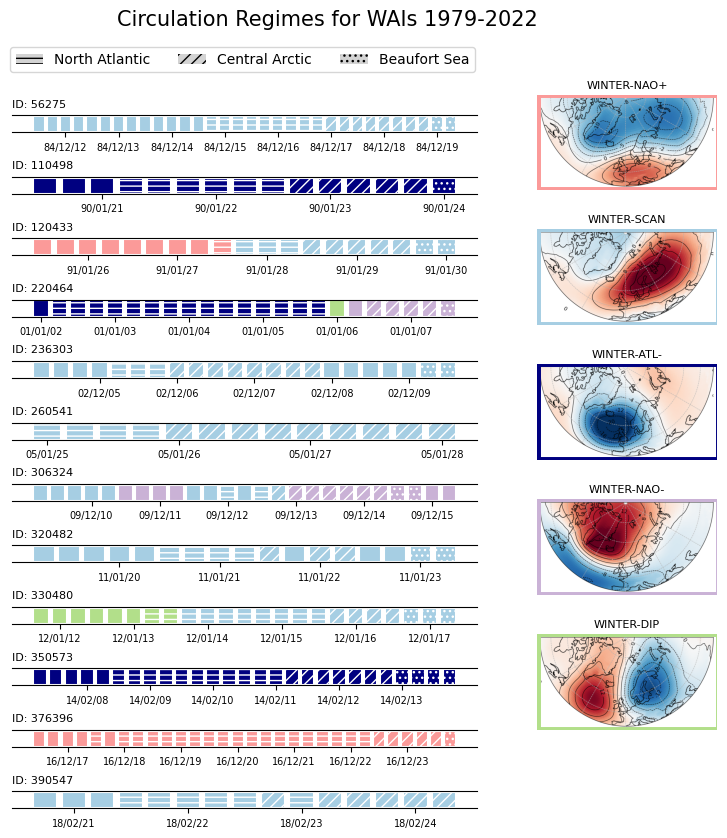

In [48]:
plot_circulation(objs_final,atlantic_regimes,df_atlantic_dates)

## Pacific Clusters

In [49]:
df_pacific_clusters = xr.open_dataset('/work/aa0049/a271122/ERA5/CirculationRegime_clusters/KMEANSslp.4dx4dy_djf_aac_unnorm_5cluster_20PC_pacific.nc')

In [50]:
df_pacific_dates = pd.read_csv('/work/aa0049/a271122/ERA5/CirculationRegime_clusters/KMEANSslp.4dx4dy_djf_aac_unnorm_5cluster_20PC_dates_pacific', sep=' ', header=0, names=['year', 'month', 'day','hour', 'cluster'])


In [51]:
df_pacific_dates['date'] = pd.to_datetime(df_pacific_dates[['year', 'month', 'day','hour']])

In [52]:
NA_bool_pacific = df_pacific_dates['date'].isin(NA_combined_times)
CA_bool_pacific = df_pacific_dates['date'].isin(CA_combined_times)
BS_bool_pacific = df_pacific_dates['date'].isin(BS_combined_times)

In [53]:
choices = ['NA', 'CA', 'BS']


In [54]:
#Create new column for the df_atlantic_dates dataframe which shows if at that time, an object (objs_final) is in a certain domain
conditions_pacific = [NA_bool_pacific, CA_bool_pacific, BS_bool_pacific]

In [55]:
df_pacific_dates['domain'] = np.select(conditions_pacific, choices, default='NONE')

#Define regime colors and images in dictionary
pacific_regimes = {
    '1': {'name':'PACIFIC TROUGH','color': 'indigo', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_1_upper_half_horizontal.png'},
    '2': {'name':'ARCTIC HIGH','color': 'orange', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_2_upper_half_horizontal.png'},
    '3': {'name':'ARCTIC LOW','color': 'lightblue', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_3_upper_half_horizontal.png'},
    '4': {'name':'PACIFIC WAVE TRAIN','color': 'grey', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_4_upper_half_horizontal.png'},
    '5': {'name':'ALASKAN RIDGE','color': 'pink', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_5_upper_half_horizontal.png'}
}
#['#FDBF6F', '#FF7F00', '#1F78B4', '#33A02C', '#6A3D9A']

In [56]:
#Create new column for the df_atlantic_dates dataframe which shows if at that time, an object (objs_final) is in a certain domain
conditions_pacific = [NA_bool_pacific, CA_bool_pacific, BS_bool_pacific]

df_pacific_dates['domain'] = np.select(conditions_pacific, choices, default='NONE')

#Define regime colors and images in dictionary
pacific_regimes = {
    '1': {'name':'PACIFIC TROUGH','color': 'rosybrown', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_1_upper_half_horizontal.png'},
    '2': {'name':'ARCTIC HIGH','color': 'firebrick', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_2_upper_half_horizontal.png'},
    '3': {'name':'ARCTIC LOW','color': 'peru', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_3_upper_half_horizontal.png'},
    '4': {'name':'PACIFIC WAVE TRAIN','color': 'teal', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_4_upper_half_horizontal.png'},
    '5': {'name':'ALASKAN RIDGE','color': 'indigo', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_5_upper_half_horizontal.png'}
}
#['#FDBF6F', '#FF7F00', '#1F78B4', '#33A02C', '#6A3D9A']
#['rosybrown', 'firebrick', 'peru', 'teal', 'indigo']

In [57]:
df_pacific_dates

,year,month,day,hour,cluster,date,domain
0,1979,1,1,6,1,1979-01-01 06:00:00,NONE
1,1979,1,1,12,1,1979-01-01 12:00:00,NONE
2,1979,1,1,18,1,1979-01-01 18:00:00,NONE
3,1979,1,2,0,1,1979-01-02 00:00:00,NONE
4,1979,1,2,6,1,1979-01-02 06:00:00,NONE
...,...,...,...,...,...,...,...
15834,2022,12,30,18,4,2022-12-30 18:00:00,NONE
15835,2022,12,31,0,4,2022-12-31 00:00:00,NONE
15836,2022,12,31,6,4,2022-12-31 06:00:00,NONE
15837,2022,12,31,12,4,2022-12-31 12:00:00,NONE


In [58]:
#Create new column for the df_atlantic_dates dataframe which shows if at that time, an object (objs_final) is in a certain domain
cl1_bool = df_pacific_dates['cluster']==1
cl4_bool = df_pacific_dates['cluster']==4
cl3_bool = df_pacific_dates['cluster']==3
cl2_bool = df_pacific_dates['cluster']==2
cl5_bool = df_pacific_dates['cluster']==5
conditions = [cl1_bool,cl2_bool,cl3_bool,cl4_bool,cl5_bool]
#choices = ['CL1', 'CL2', 'CL3','CL4','CL5']
choices = ['PACIFIC TROUGH','ARCTIC HIGH','ARCTIC LOW','PACIFIC WAVE TRAIN', 'ALASKAN RIDGE']
df_pacific_dates['cluster_names'] = np.select(conditions, choices, default='NONE')
        

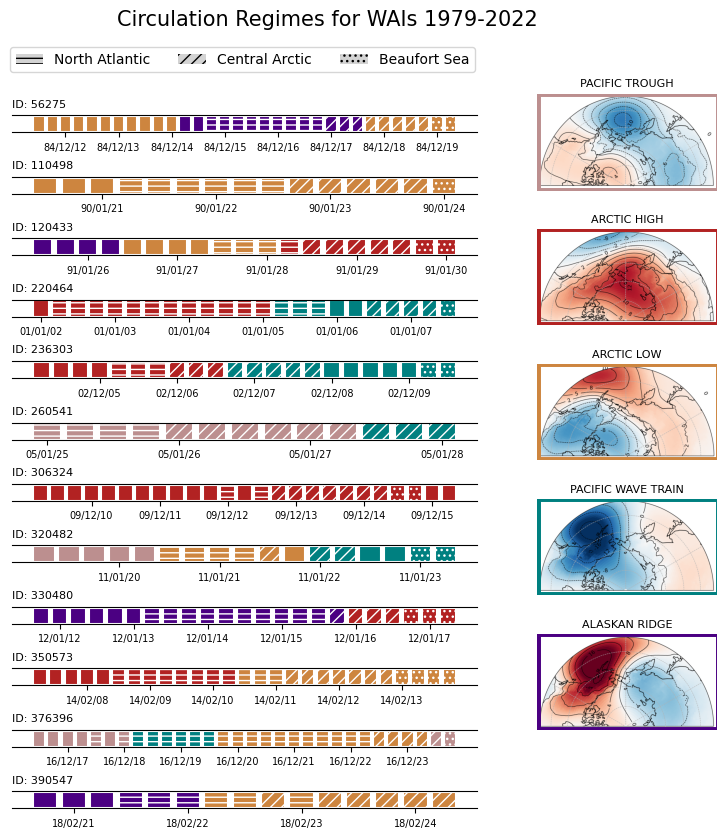

In [59]:
plot_circulation(objs_final,pacific_regimes,df_pacific_dates)

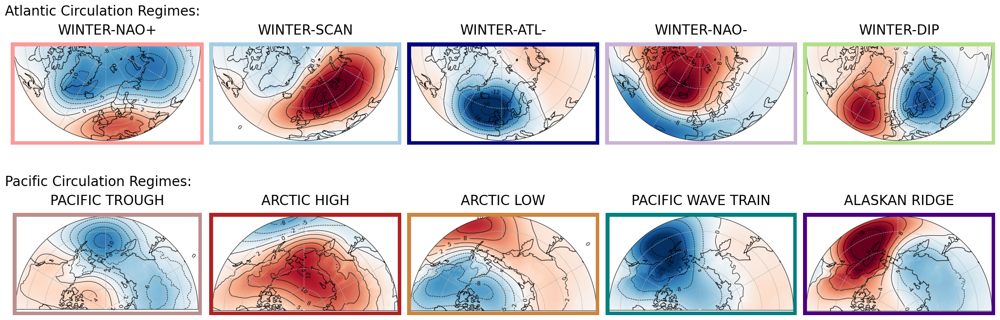

In [60]:

fig = plt.figure(figsize=(14, 7))

#image_positions = [0.7, 0.55, 0.40, 0.25, 0.1]  # Vertical
image_positions_h = [0, 0.29, 2*0.29, 3*0.29, 4*0.29]  # horizontal
width = 0.3
height = 0.3

for i, (name, info) in enumerate(atlantic_regimes.items()):
    img = mpimg.imread(info['image'])
    
    #positions
    ax_img = fig.add_axes([image_positions_h[i], 1, width, height])  #[left, bottom, width, height]
    ax_img.imshow(img)
    ax_img.axis('off')
    
    #Add frame and regime title
    rect = Rectangle((0, 0), 1.0, 1.0, linewidth=11, edgecolor=info['color'], facecolor='none', transform=ax_img.transAxes)
    ax_img.add_patch(rect)
    ax_img.text(0.5, 1.05, info['name'], ha='center', va='bottom', fontsize=20, color='k', transform=ax_img.transAxes)

for i, (name, info) in enumerate(pacific_regimes.items()):
    img = mpimg.imread(info['image'])
    
    #positions
    ax_img = fig.add_axes([image_positions_h[i], 0.5, width, height])  #[left, bottom, width, height]
    ax_img.imshow(img)
    ax_img.axis('off')
    
    #Add frame and regime title
    rect = Rectangle((0, 0), 1.0, 1.0, linewidth=11, edgecolor=info['color'], facecolor='none', transform=ax_img.transAxes)
    ax_img.add_patch(rect)
    ax_img.text(0.5, 1.05, info['name'], ha='center', va='bottom', fontsize=20, color='k', transform=ax_img.transAxes)


#Add title
fig.text(0,0.88,'Pacific Circulation Regimes:',fontsize=20)
fig.text(0,1.38,'Atlantic Circulation Regimes:',fontsize=20)
plt.savefig('/work/aa0049/a271122/ERA5/CirculationRegime_clusters/overview.png', bbox_inches='tight', dpi=300)
plt.show()


## Arctic Clusters

In [61]:
arctic_cluster_path = '/work/aa0049/a271122/ERA5/CirculationRegime_clusters/'

In [62]:
df_clusters = xr.open_dataset('/work/aa0049/a271122/ERA5/CirculationRegime_clusters/KMEANSslp.4dx4dy_djf_aac_unnorm_6cluster_20PC.nc')

In [63]:
df_clusters_dates = pd.read_csv('/work/aa0049/a271122/ERA5/CirculationRegime_clusters/KMEANSslp.4dx4dy_djf_aac_unnorm_6cluster_20PC_dates', sep=' ', header=0, names=['year', 'month', 'day','hour', 'cluster'])


In [64]:
df_clusters_dates['date'] = pd.to_datetime(df_clusters_dates[['year', 'month', 'day','hour']])

In [65]:
NA_bool_arctic = df_clusters_dates['date'].isin(NA_combined_times)
CA_bool_arctic = df_clusters_dates['date'].isin(CA_combined_times)
BS_bool_arctic = df_clusters_dates['date'].isin(BS_combined_times)

In [70]:
#Create new column for the df_atlantic_dates dataframe which shows if at that time, an object (objs_final) is in a certain domain
conditions_arctic = [NA_bool_arctic, CA_bool_arctic, BS_bool_arctic]
choices = ['NA', 'CA', 'BS']

df_clusters_dates['domain'] = np.select(conditions_arctic, choices, default='NONE')

#Define regime colors and images in dictionary
arctic_regimes = {
    '1': {'name':'cl1','color': 'grey', 'image': f"{arctic_cluster_path}/regime_images/djf_cluster_1.png"},
    '2': {'name':'cl2','color': 'lightblue', 'image': f"{arctic_cluster_path}/regime_images/djf_cluster_2.png"},
    '3': {'name':'cl3','color': 'orange', 'image': f"{arctic_cluster_path}/regime_images/djf_cluster_3.png"},
    '4': {'name':'cl4','color': 'indigo', 'image': f"{arctic_cluster_path}/regime_images/djf_cluster_4.png"},
    '5': {'name':'cl5','color': 'red', 'image': f"{arctic_cluster_path}/regime_images/djf_cluster_5.png"},
    '6': {'name':'cl6','color': 'pink', 'image': f"{arctic_cluster_path}/regime_images/djf_cluster_6.png"}
}

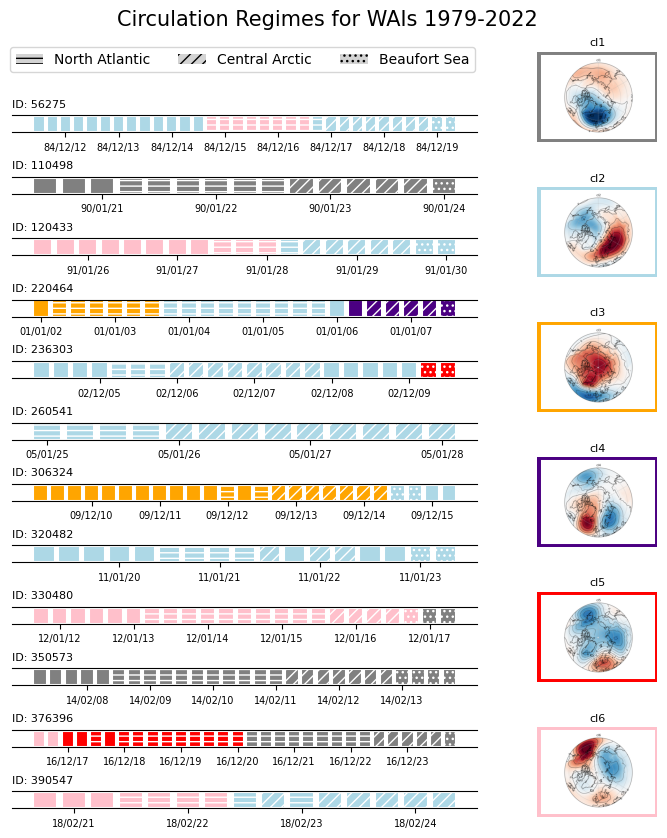

In [71]:
plot_circulation(objs_final,arctic_regimes,df_clusters_dates,True)

# Stats

In [72]:
#Define regime colors and images in dictionary
atlantic_regimes = {
    '1': {'name':'WINTER-NAO+','color': '#FB9A99', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_1_upper_half_horizontal.png'},
    '2': {'name':'WINTER-SCAN','color': '#A6CEE3', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_2_upper_half_horizontal.png'},
    '3': {'name':'WINTER-ATL-','color': 'navy', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_3_upper_half_horizontal.png'},
    '4': {'name':'WINTER-NAO-','color': '#CAB2D6', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_4_upper_half_horizontal.png'},
    '5': {'name':'WINTER-DIP','color': '#B2DF8A', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_5_upper_half_horizontal.png'}
}


#### Atlantic Clusters

In [90]:
df_atlantic_dates

,year,month,day,hour,cluster,date,domain,cluster_names
0,1979,1,1,6,5,1979-01-01 06:00:00,NONE,WINTER-DIP
1,1979,1,1,12,5,1979-01-01 12:00:00,NONE,WINTER-DIP
2,1979,1,1,18,5,1979-01-01 18:00:00,NONE,WINTER-DIP
3,1979,1,2,0,5,1979-01-02 00:00:00,NONE,WINTER-DIP
4,1979,1,2,6,5,1979-01-02 06:00:00,NONE,WINTER-DIP
...,...,...,...,...,...,...,...,...
15834,2022,12,30,18,3,2022-12-30 18:00:00,NONE,WINTER-ATL-
15835,2022,12,31,0,3,2022-12-31 00:00:00,NONE,WINTER-ATL-
15836,2022,12,31,6,3,2022-12-31 06:00:00,NONE,WINTER-ATL-
15837,2022,12,31,12,3,2022-12-31 12:00:00,NONE,WINTER-ATL-


In [91]:
clusters = [1, 2, 3, 4, 5]
counts_all = compute_cluster_counts(df_atlantic_dates, clusters)

In [92]:
counts_all

[23.06963823473704,
 21.57333164972536,
 19.60982385251594,
 18.290296104552056,
 17.4569101584696]

In [94]:
named_cluster_weights = get_normalized_frequency(objs_final,df_atlantic_dates)
named_cluster_weights

{'NA': {'WINTER-NAO+': 10.416666666666668,
  'WINTER-SCAN': 62.916666666666664,
  'WINTER-ATL-': 25.0,
  'WINTER-NAO-': 0.0,
  'WINTER-DIP': 1.6666666666666667},
 'CA': {'WINTER-NAO+': 8.333333333333332,
  'WINTER-SCAN': 59.523809523809526,
  'WINTER-ATL-': 16.666666666666664,
  'WINTER-NAO-': 15.476190476190476,
  'WINTER-DIP': 0.0},
 'BS': {'WINTER-NAO+': 10.0,
  'WINTER-SCAN': 50.0,
  'WINTER-ATL-': 20.0,
  'WINTER-NAO-': 20.0,
  'WINTER-DIP': 0.0}}

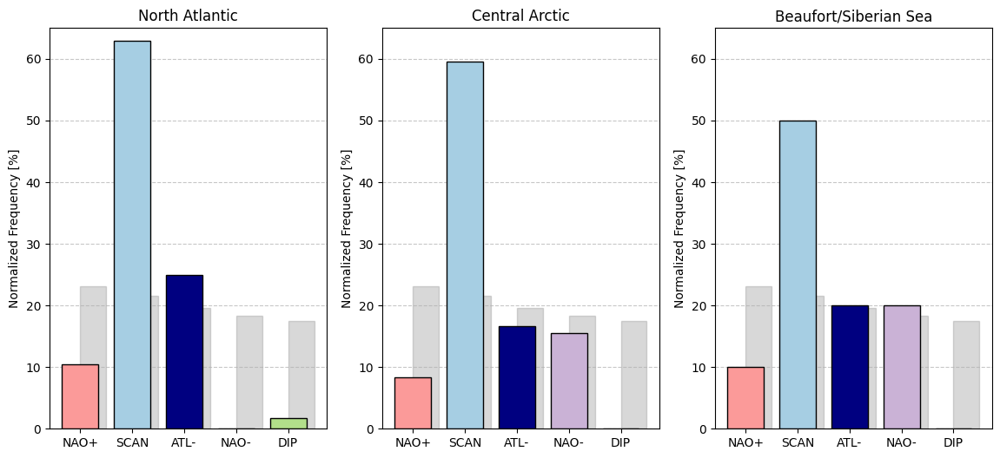

In [103]:
plot_hourly_hist(named_cluster_weights,counts_all,'atlantic')

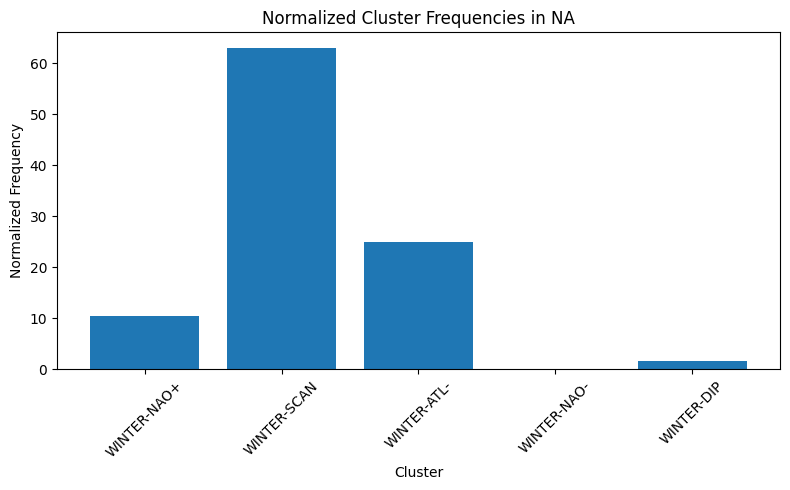

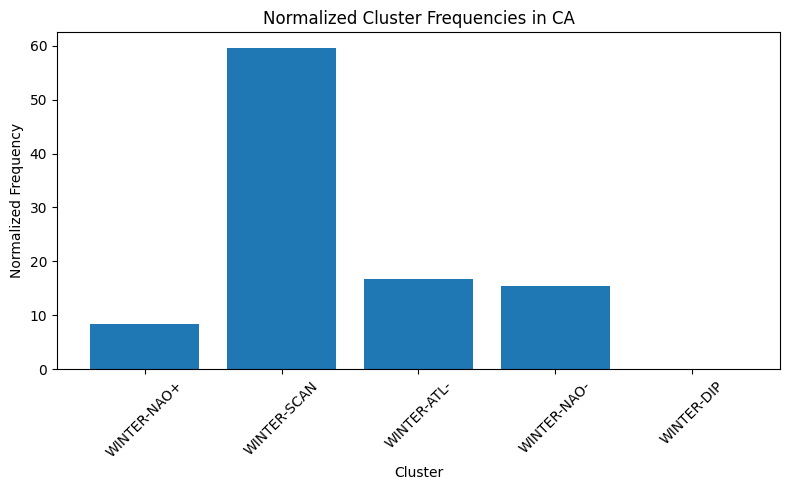

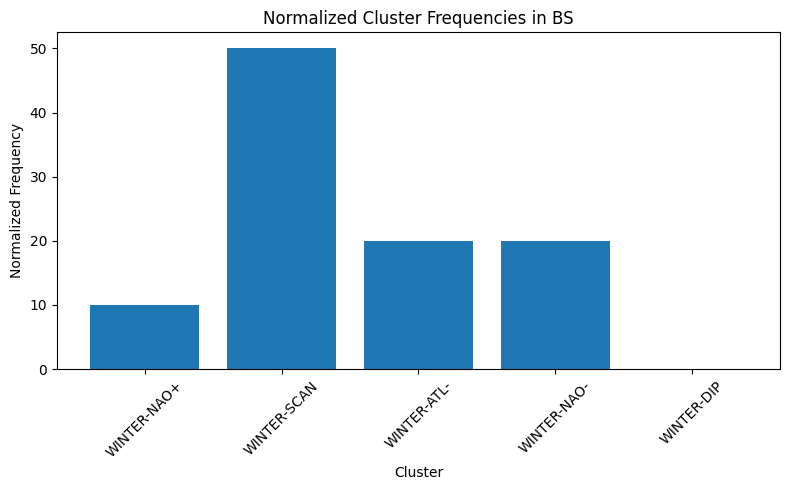

In [82]:
# Plot per domain
for domain, weights in named_cluster_weights.items():
    plt.figure(figsize=(8, 5))
    clusters = list(weights.keys())
    values = list(weights.values())
    
    plt.bar(clusters, values)
    plt.title(f'Normalized Cluster Frequencies in {domain}')
    plt.xlabel('Cluster')
    plt.ylabel('Normalized Frequency')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


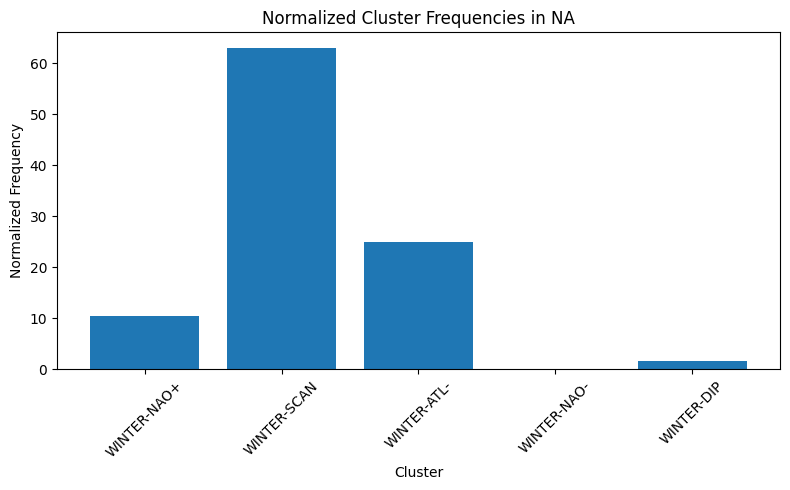

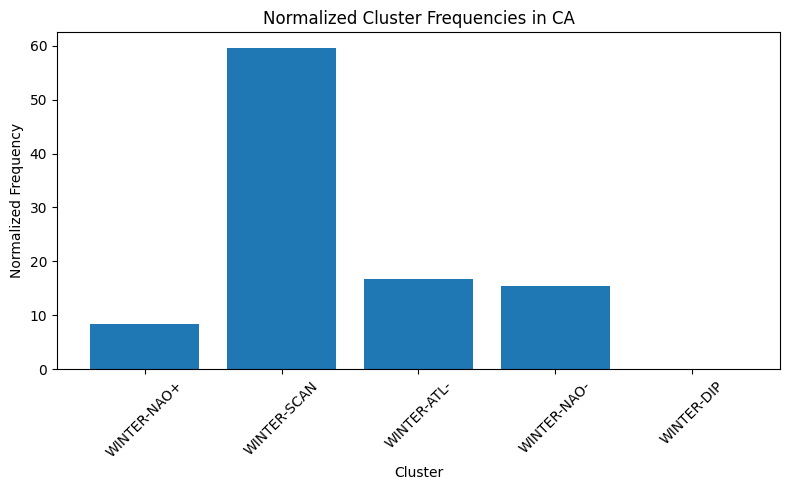

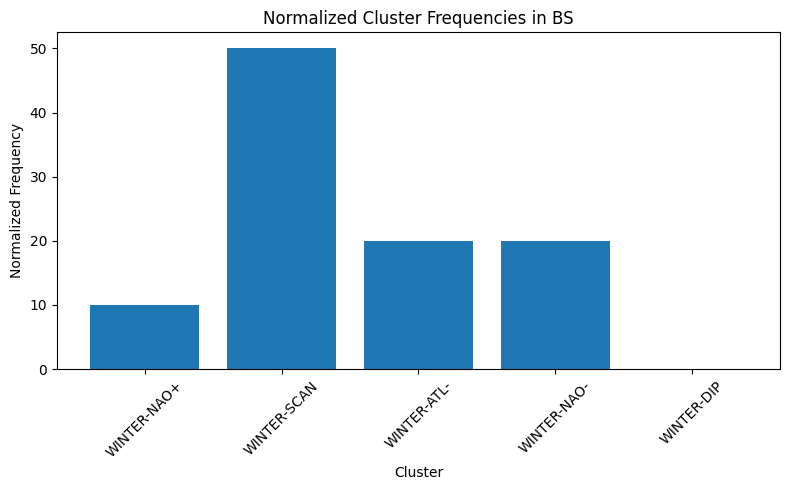

In [83]:
# Plot per domain
for domain, weights in named_cluster_weights.items():
    plt.figure(figsize=(8, 5))
    clusters = list(weights.keys())
    values = list(weights.values())
    
    plt.bar(clusters, values)
    plt.title(f'Normalized Cluster Frequencies in {domain}')
    plt.xlabel('Cluster')
    plt.ylabel('Normalized Frequency')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


#### Pacific Clusters

In [107]:
clusters = [1, 2, 3, 4, 5]
counts_pacific_all = compute_cluster_counts(df_pacific_dates, clusters)

In [108]:
counts_pacific_all

[23.940905360186882,
 20.203295662604962,
 19.874992108087632,
 19.205757939263844,
 16.775048929856684]

In [109]:
named_cluster_weights = get_normalized_frequency(objs_final,df_pacific_dates)
named_cluster_weights

{'NA': {'WINTER-NAO+': 9.210526315789474,
  'WINTER-SCAN': 31.47727272727273,
  'WINTER-ATL-': 34.180622009569376,
  'WINTER-NAO-': 4.298245614035088,
  'WINTER-DIP': 20.833333333333336},
 'CA': {'WINTER-NAO+': 7.222222222222223,
  'WINTER-SCAN': 26.041666666666668,
  'WINTER-ATL-': 39.65277777777778,
  'WINTER-NAO-': 21.875,
  'WINTER-DIP': 5.208333333333334},
 'BS': {'WINTER-NAO+': 10.0,
  'WINTER-SCAN': 30.0,
  'WINTER-ATL-': 30.0,
  'WINTER-NAO-': 30.0,
  'WINTER-DIP': 0.0}}

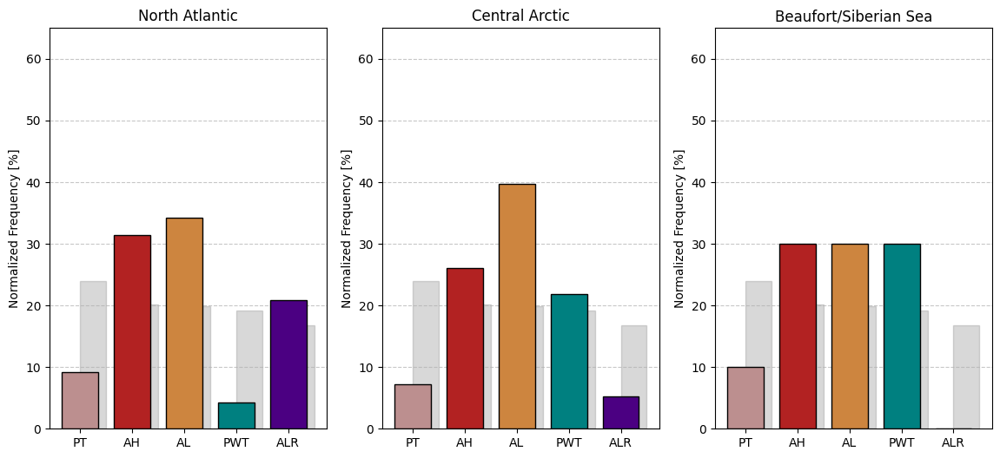

In [114]:
plot_hourly_hist(named_cluster_weights,counts_pacific_all,'pacific',Pacific=True)

##### Atlantic

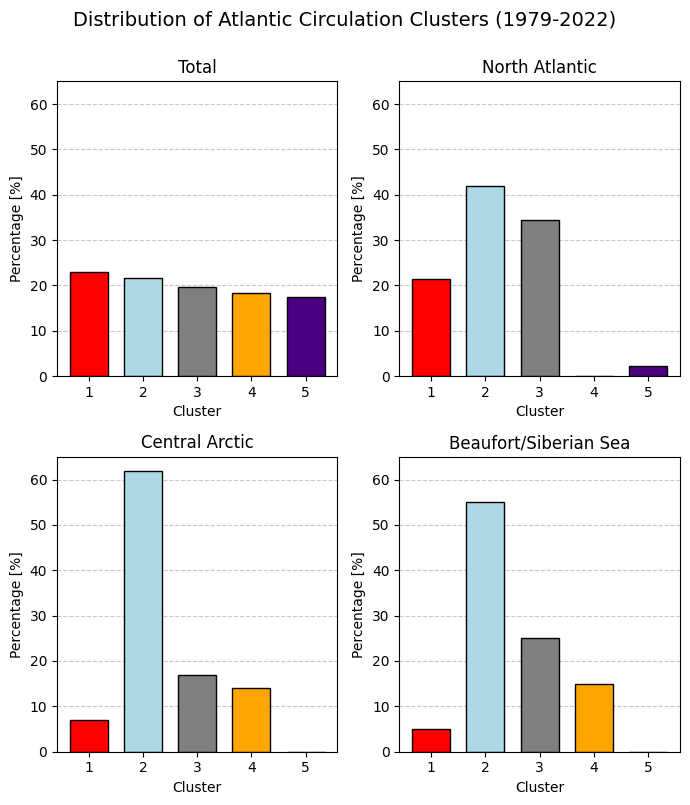

In [115]:
plot_cluster_distribution(df_atlantic_dates, 'Atlantic',['red', 'lightblue', 'grey', 'orange', 'indigo'])

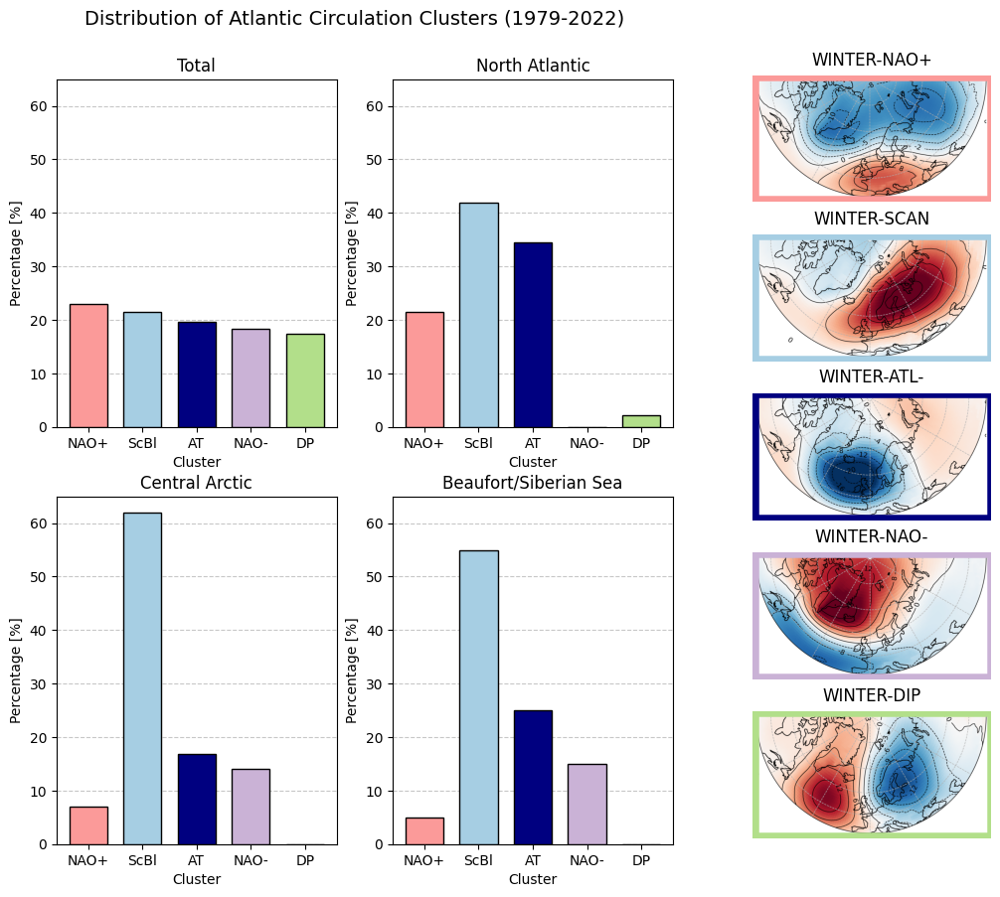

In [118]:
plot_cluster_distribution_withClusters(df_atlantic_dates, 'Atlantic',['#FB9A99','#A6CEE3', 'navy', '#CAB2D6','#B2DF8A'],atlantic_regimes,Atlantic=True)

##### Pacific

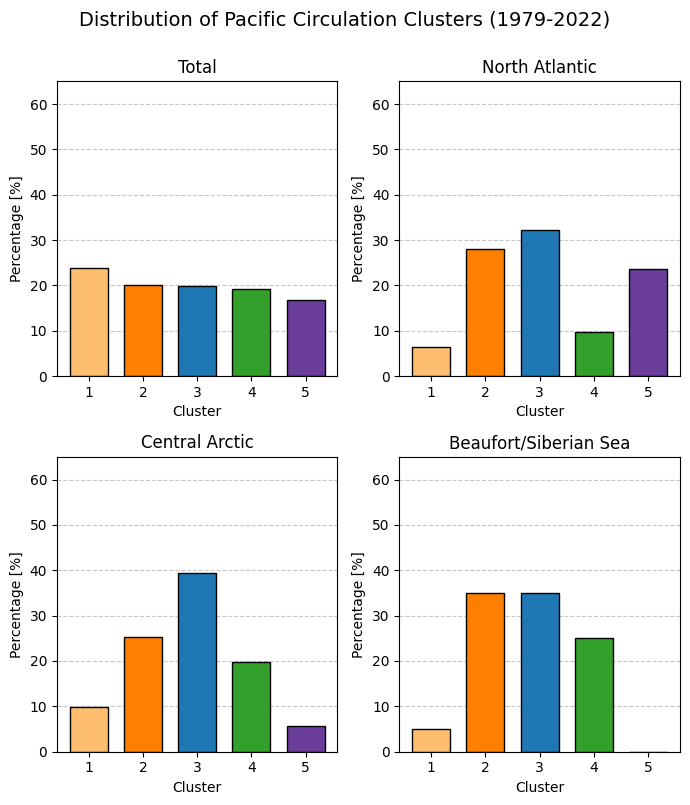

In [119]:
plot_cluster_distribution(df_pacific_dates, 'Pacific',['#FDBF6F', '#FF7F00', '#1F78B4', '#33A02C', '#6A3D9A'])

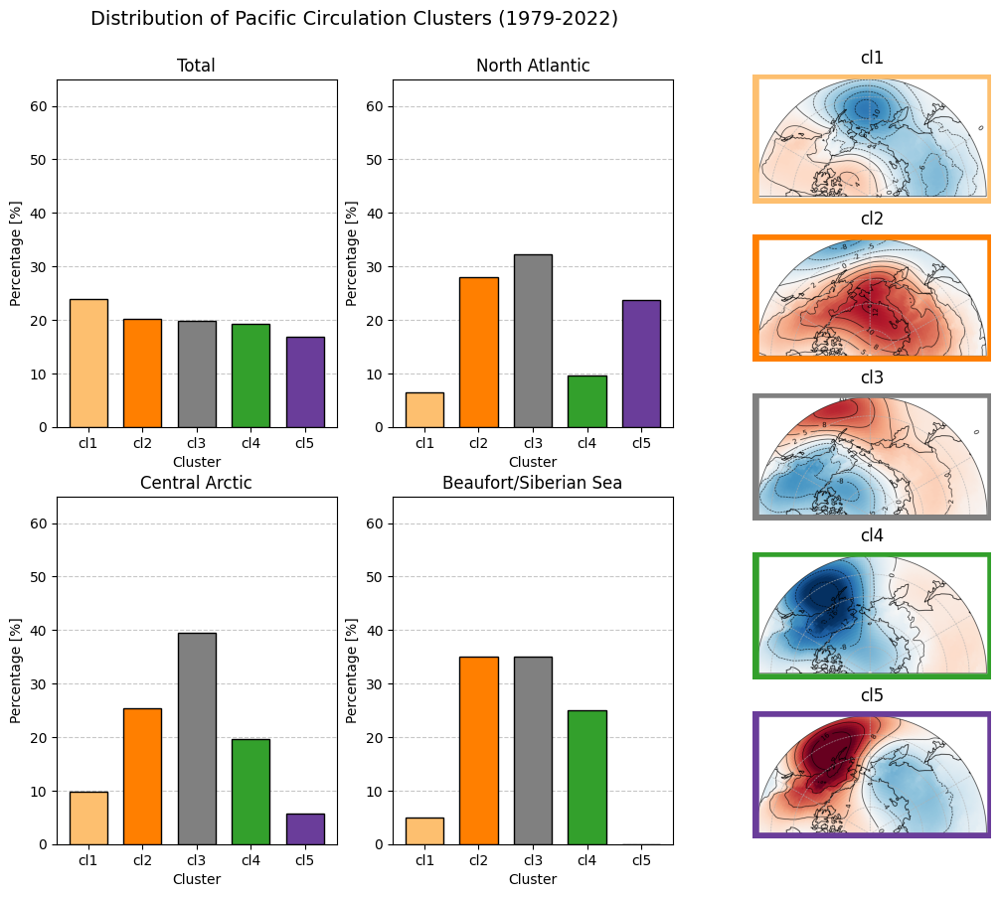

In [120]:

#Define regime colors and images in dictionary
pacific_regimes = {
    '1': {'name':'cl1','color': '#FDBF6F', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_1_upper_half_horizontal.png'},
    '2': {'name':'cl2','color': '#FF7F00', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_2_upper_half_horizontal.png'},
    '3': {'name':'cl3','color': 'grey', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_3_upper_half_horizontal.png'},
    '4': {'name':'cl4','color': '#33A02C', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_4_upper_half_horizontal.png'},
    '5': {'name':'cl5','color': '#6A3D9A', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_5_upper_half_horizontal.png'}
}

plot_cluster_distribution_withClusters(df_pacific_dates, 'Pacific',['#FDBF6F', '#FF7F00', 'grey', '#33A02C', '#6A3D9A'],pacific_regimes)

##### Arctic

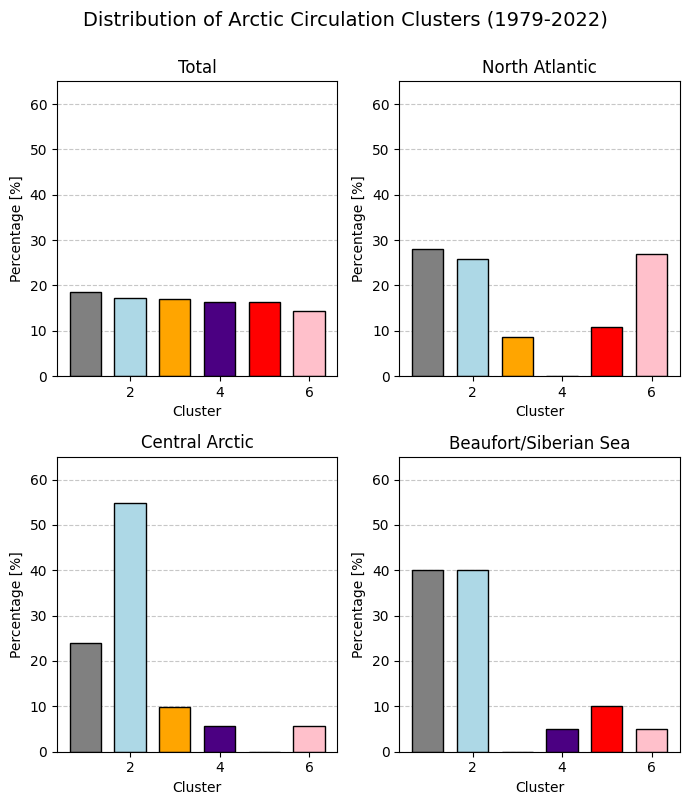

In [121]:
plot_cluster_distribution(df_clusters_dates, 'Arctic',['grey', 'lightblue', 'orange', 'indigo', 'red','pink'],True)

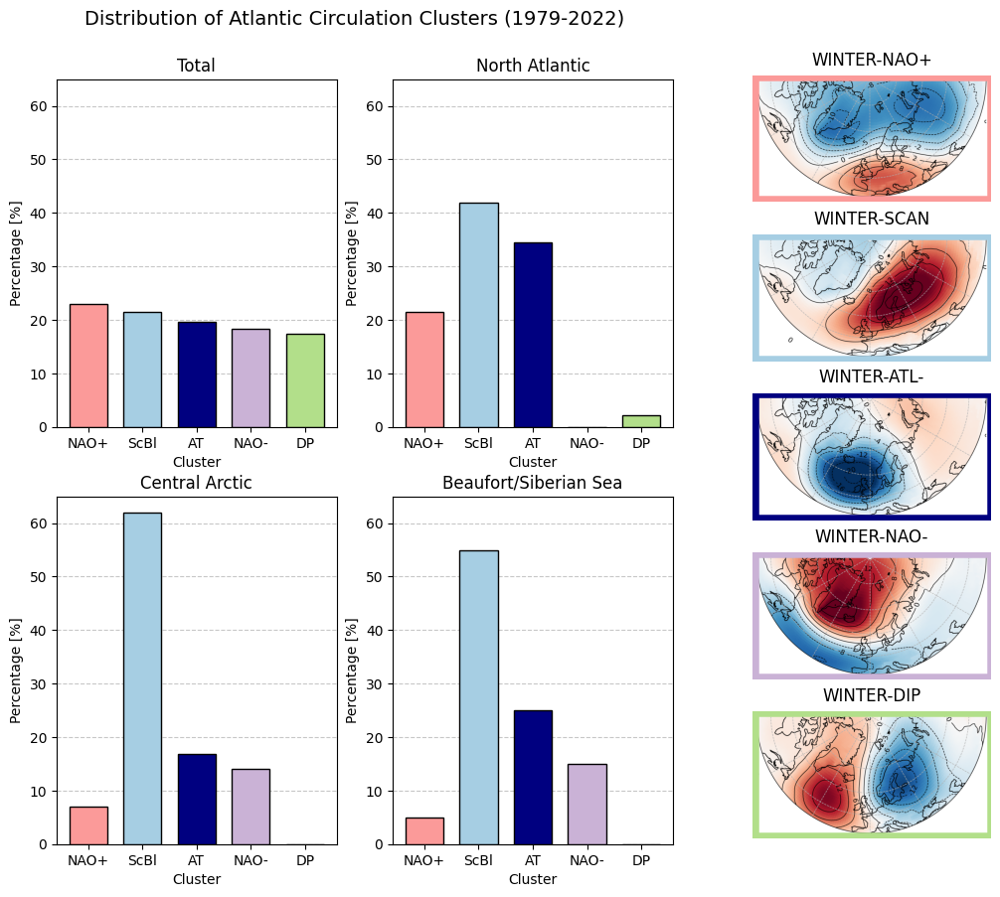

In [124]:
plot_cluster_distribution_withClusters(df_atlantic_dates, 'Atlantic',['#FB9A99','#A6CEE3', 'navy', '#CAB2D6','#B2DF8A'],atlantic_regimes,Atlantic=True)

### GPH Clusters

In [3]:
clusters_info= xr.open_dataset('/work/aa0238/a271093/data/clustering/ERA5/ERA5_gph50000_1984_2014_reglonlat_-90_90_20_88_1deg_DJF.nc')

In [5]:
clusters_info.zg

<xarray.DataArray 'zg' (time: 2798, lat: 61, lon: 161)>
[27479158 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 1984-01-01T12:00:00 ... 2014-12-31T12:00:00
  * lon      (lon) float64 -90.0 -88.88 -87.75 -86.62 ... 86.62 87.75 88.88 90.0
  * lat      (lat) float64 87.54 86.42 85.29 84.17 ... 23.47 22.34 21.22 20.09
    plev     float64 ...
Attributes:
    standard_name:  geopotential_height
    long_name:      Geopotential height
    units:          m
    code:           129
    table:          128
    original_name:  var129

# Tracks

In [ ]:
#objs_final[4].clusters

In [125]:
all_clusters = []
for i in range(0,12):
    all_clusters.append(objs_final[i].clusters.values)

In [126]:
atlantic_regimes = {
    'WINTER-NAO+': '#FB9A99',
    'WINTER-SCAN': '#A6CEE3',
    'WINTER-ATL-': 'navy',
    'WINTER-NAO-': '#CAB2D6',
    'WINTER-DIPOLE': '#B2DF8A'
    
}

# Simplified keys 
regime_keys = list(atlantic_regimes.keys())
regime_colors = [atlantic_regimes[k] for k in regime_keys]

# Create a mapping from category to index
regime_to_index = {regime: i for i, regime in enumerate(regime_keys)}

# Convert `all_clusters` from strings to indices
cluster_indices = np.array([regime_to_index.get(c, np.nan) for c in all_clusters])

# Create a categorical colormap
cmap = mcolors.ListedColormap(regime_colors)
norm = mcolors.BoundaryNorm(boundaries=np.arange(len(regime_keys)+1)-0.5, ncolors=len(regime_keys))


TypeError: unhashable type: 'numpy.ndarray'

In [ ]:
#Create new column for the df_atlantic_dates dataframe which shows if at that time, an object (objs_final) is in a certain domain
NAO_plus_bool = df_atlantic_dates['cluster']==1
NAO_minus_bool = df_atlantic_dates['cluster']==4
ATL_bool = df_atlantic_dates['cluster']==3
SCAN_bool = df_atlantic_dates['cluster']==2
DP_bool = df_atlantic_dates['cluster']==5
conditions = [NAO_plus_bool,NAO_minus_bool,ATL_bool,SCAN_bool,DP_bool]
choices = ['WINTER-NAO+', 'WINTER-NAO-', 'WINTER-ATL-','WINTER-SCAN','WINTER-DIP']

df_atlantic_dates['cluster_names'] = np.select(conditions, choices, default='NONE')
        

In [95]:
type(objs_final[10].times.values)

numpy.ndarray

In [96]:
df_atlantic_dates_dt = df_atlantic_dates
df_atlantic_dates_dt['date'] = pd.to_datetime(df_atlantic_dates_dt['date']).dt.floor('H')
obj_11_dt = pd.to_datetime(objs_final[10].times).floor('H')

# Filter
objs_11_cluster = df_atlantic_dates_dt[df_atlantic_dates_dt['date'].isin(obj_11_dt)]['cluster_names'].to_numpy()
objs_11_cluster

array(['WINTER-NAO+', 'WINTER-NAO+', 'WINTER-NAO+', 'WINTER-NAO+',
       'WINTER-NAO+', 'WINTER-NAO+', 'WINTER-NAO+', 'WINTER-NAO+',
       'WINTER-NAO+', 'WINTER-NAO+', 'WINTER-NAO+', 'WINTER-NAO+',
       'WINTER-NAO+', 'WINTER-NAO+', 'WINTER-NAO+', 'WINTER-NAO+',
       'WINTER-NAO+', 'WINTER-NAO+', 'WINTER-NAO+', 'WINTER-NAO+',
       'WINTER-NAO+', 'WINTER-NAO+', 'WINTER-NAO+', 'WINTER-NAO+',
       'WINTER-NAO+', 'WINTER-NAO+', 'WINTER-NAO+', 'WINTER-NAO+',
       'WINTER-NAO+', 'WINTER-NAO+'], dtype=object)

In [97]:
objs_11_array = ['WINTER-NAO+']*182
cluster_11 = xr.DataArray(objs_11_array, coords=[objs_final[10].times], dims=['times'])
objs_final[10]['clusters'] = cluster_11
objs_final[10]

<xarray.Dataset>
Dimensions:          (times: 182)
Coordinates:
  * times            (times) datetime64[ns] 2016-12-16T19:00:00 ... 2016-12-2...
Data variables: (12/17)
    id_              <U6 '376396'
    exp              object <class 'src.Experiments_infos.ERA5'>
    size             (times) float64 1.172e+05 1.59e+05 ... 3.432e+04 1.105e+04
    total_IVT        (times) float32 4.88e+04 6.293e+04 ... 3.156e+03 1.012e+03
    mean_IVT         (times) float32 390.4 372.3 361.4 ... 103.1 101.8 101.2
    max_IVT          (times) float32 537.9 541.6 532.8 ... 106.4 104.4 102.2
    ...               ...
    gridpoints       (times) object [RotatedGridPoint(lat=30.700000762939453,...
    clusters         (times) <U11 'WINTER-NAO+' 'WINTER-NAO+' ... 'WINTER-NAO+'
    lat              (times) float32 32.5 32.2 31.9 31.6 ... -4.1 -4.7 -5.0 -5.9
    lon              (times) float32 25.9 25.6 24.7 24.1 ... -2.6 -2.6 -2.9 -2.9
    geo_lat          (times) float64 54.59 54.98 55.75 ... 78.45 78.09 77.22
    geo_lon          (times) float64 -39.48 -39.58 -39.07 ... 166.9 165.9 166.9

In [98]:
obj_12_dt = pd.to_datetime(objs_final[11].times).floor('H')

# Filter
objs_12_cluster = df_atlantic_dates_dt[df_atlantic_dates_dt['date'].isin(obj_12_dt)]['cluster_names'].to_numpy()
objs_12_cluster

array(['WINTER-SCAN', 'WINTER-SCAN', 'WINTER-SCAN', 'WINTER-SCAN',
       'WINTER-SCAN', 'WINTER-SCAN', 'WINTER-SCAN', 'WINTER-SCAN',
       'WINTER-SCAN', 'WINTER-SCAN', 'WINTER-SCAN', 'WINTER-SCAN',
       'WINTER-SCAN', 'WINTER-SCAN', 'WINTER-SCAN'], dtype=object)

In [99]:
objs_12_array = ['WINTER-SCAN']*len(objs_final[11].times)

cluster_12 = xr.DataArray(objs_12_array, coords=[objs_final[11].times], dims=['times'])
objs_final[11]['clusters'] = cluster_12
objs_final[11]

<xarray.Dataset>
Dimensions:          (times: 95)
Coordinates:
  * times            (times) datetime64[ns] 2018-02-21T01:00:00 ... 2018-02-2...
Data variables: (12/17)
    id_              <U6 '390547'
    exp              object <class 'src.Experiments_infos.ERA5'>
    size             (times) float64 9.405e+04 1.354e+05 ... 4.548e+04 3.436e+04
    total_IVT        (times) float32 3.462e+04 5.593e+04 ... 4.305e+03 3.201e+03
    mean_IVT         (times) float32 342.7 385.7 415.5 ... 104.4 105.0 103.3
    max_IVT          (times) float32 536.6 731.0 823.3 ... 108.8 109.3 106.1
    ...               ...
    gridpoints       (times) object [RotatedGridPoint(lat=32.20000076293945, ...
    clusters         (times) <U11 'WINTER-SCAN' 'WINTER-SCAN' ... 'WINTER-SCAN'
    lat              (times) float32 33.1 32.8 32.5 32.2 ... -2.6 -3.2 -3.5 -4.1
    lon              (times) float32 14.5 14.2 13.6 13.0 ... 1.0 1.3 0.4 0.7
    geo_lat          (times) float64 60.23 60.62 61.13 ... 80.16 79.94 79.33
    geo_lon          (times) float64 -24.99 -24.85 -24.25 ... -177.7 -176.2

In [100]:
df_objs

,id,color
0,1,"(0.12156862745098039, 0.4666666666666667, 0.70..."
1,2,"(1.0, 0.4980392156862745, 0.054901960784313725)"
2,3,"(0.17254901960784313, 0.6274509803921569, 0.17..."
3,4,"(0.8392156862745098, 0.15294117647058825, 0.15..."
4,5,"(0.5803921568627451, 0.403921568627451, 0.7411..."
...,...,...
99783,426438,"(0.8392156862745098, 0.15294117647058825, 0.15..."
99784,426439,"(0.5803921568627451, 0.403921568627451, 0.7411..."
99785,426440,"(0.5490196078431373, 0.33725490196078434, 0.29..."
99786,426441,"(0.8901960784313725, 0.4666666666666667, 0.760..."


/tmp/ipykernel_3607458/1636487915.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("tab20b", len(objs_final))  # You can try "plasma", "cividis", etc.


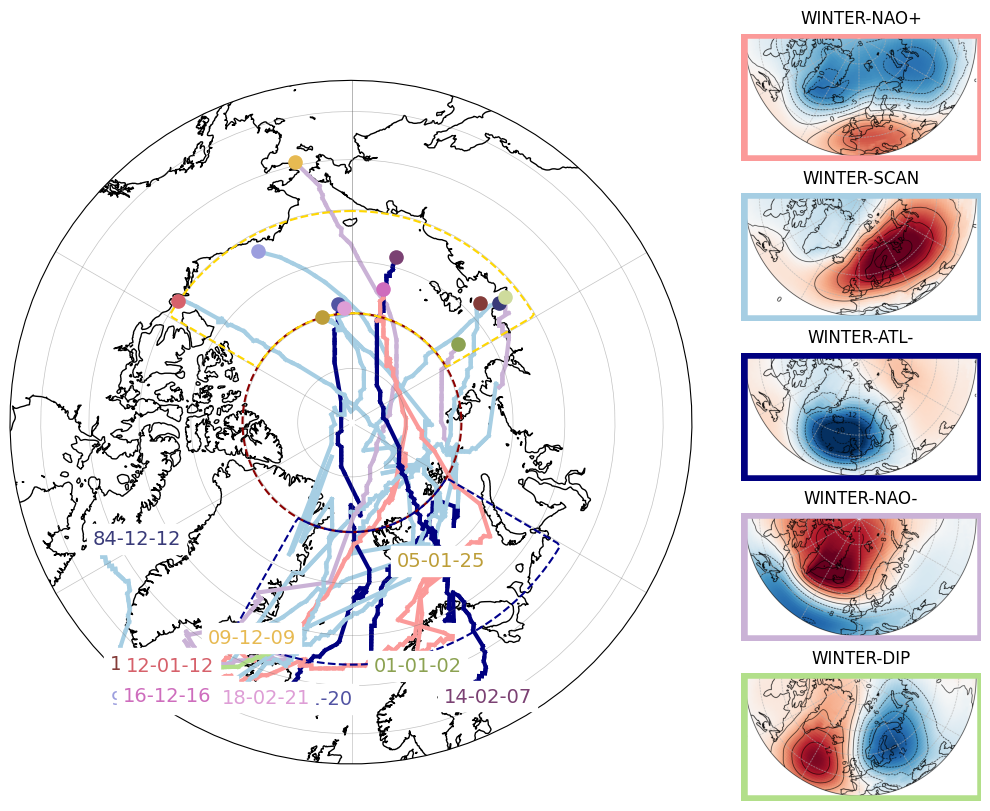

In [101]:
##ORIGINAL DO NOT CHANGE
fig,ax=plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(8,10))
objs_nr=len(objs_final[0:12])
# Define your regime colors
# 2. Choose a sequential colormap and sample it
cmap = cm.get_cmap("tab20b", len(objs_final))  # You can try "plasma", "cividis", etc.
obj_color_all = [cmap(i) for i in range(len(objs_final))]
atlantic_regimes = {
    'WINTER-NAO+': {'color': '#FB9A99', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_1_upper_half_horizontal.png'},
    'WINTER-SCAN': {'color': '#A6CEE3', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_2_upper_half_horizontal.png'},
    'WINTER-ATL-': {'color': 'navy', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_3_upper_half_horizontal.png'},
    'WINTER-NAO-': {'color': '#CAB2D6', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_4_upper_half_horizontal.png'},
    'WINTER-DIP': {'color': '#B2DF8A', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_5_upper_half_horizontal.png'}
}

for ii in range(0,12):
    cluster_values = objs_final[ii].clusters.values
    #print(cluster_values)
    track=objs_final[ii].track.values
    
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])    


    obj_id=objs_final[ii]['id_'].item()
    obj_color = obj_color_all[ii]
    #obj_color=df_objs[  df_objs['id'] == obj_id].color.item()
    #ax.text(track_lons[-1],track_lats[-1],obj_id,fontsize=14,backgroundcolor='white',transform=crs_rot,color=obj_color,zorder=11)
    ax.text(track_lons[0],track_lats[0],str(pd.to_datetime(objs_final[ii]['times'][0].values).strftime('%y-%m-%d')),fontsize=14,
            transform=crs_rot,color=obj_color,backgroundcolor='white',zorder=11) #color=obj_color
    #ax.scatter(track_lons[-1],track_lats[-1],facecolor='k',edgecolor='k',transform=crs_rot)
    ax.scatter(track_lons[-1],track_lats[-1],facecolor=obj_color,edgecolor=obj_color,transform=crs_rot,s=90,zorder =12)
    
    #ax.scatter(track_lons,track_lats,color=obj_color,transform=crs_rot)  
    #ax.plot(track_lons , track_lats ,color='k', transform = crs_rot,linewidth=3)

    for j in range(len(track_lats) - 1):
        #if np.isnan(cluster_values[j]):
        #    ax.plot(track_lons[j:j+2], track_lats[j:j+2], color='grey', transform=crs_rot, linewidth=2)
        #else:
        cluster_label = cluster_values[j]
        color = atlantic_regimes.get(cluster_label, {}).get('color', 'grey')
        ax.plot(track_lons[j:j+2], track_lats[j:j+2], color=color, transform=crs_rot, linewidth=3)

    
#duration_mean=np.array([len(obj.times) for obj in objs_final]).mean()
#this marks the domain (North Atlantic, Central Arctic and Beaufort area) 
for domain_name, domain_data in mask_domains.items():
    domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1.5,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())



#ax.text(0.02, 0.02, f'nr: {objs_nr}, duration: {int(np.round(duration_mean))}h',
#        transform=ax.transAxes, bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))
ax.coastlines()

ax.set_extent([-180,180, 60, 90], crs=ccrs.PlateCarree())
ax.gridlines(linewidth=0.5,color='dimgray',alpha=0.4,zorder=2)#,draw_labels=True)
#ax.set_title('ERA5 1979-2022',loc='left',y=1)
# Clip to circle
center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)


#fig.suptitle('IVT-Object tracks and associated synoptic pattern ERA5 1979-2022 in DJF', fontweight='bold',y=0.9)



# Add images as legend

image_positions = [0.67, 0.51, 0.35, 0.19, 0.03]  # Vertical
width = 0.3
height = 0.3

for i, (name, info) in enumerate(atlantic_regimes.items()):
    img = mpimg.imread(info['image'])
    
    #positions
    ax_img = fig.add_axes([1.0, image_positions[i], width, height])  #[left, bottom, width, height]
    ax_img.imshow(img)
    ax_img.axis('off')
    
    #Add frame and regime title
    rect = Rectangle((0, 0), 1.01, 1.01, linewidth=9, edgecolor=info['color'], facecolor='none', transform=ax_img.transAxes)
    ax_img.add_patch(rect)
    ax_img.text(0.5, 1.05, f'{name}', ha='center', va='bottom', fontsize=12, color='k', transform=ax_img.transAxes)


#plt.savefig('/work/aa0049/a271122/ERA5/CirculationRegime_clusters/tracks_ERA5.png', bbox_inches='tight', dpi=300)
plt.show()

# ORIGINAL DO NOT CHANGE

/tmp/ipykernel_3607458/1458813281.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("tab20b", len(objs_final))  # You can try "plasma", "cividis", etc.


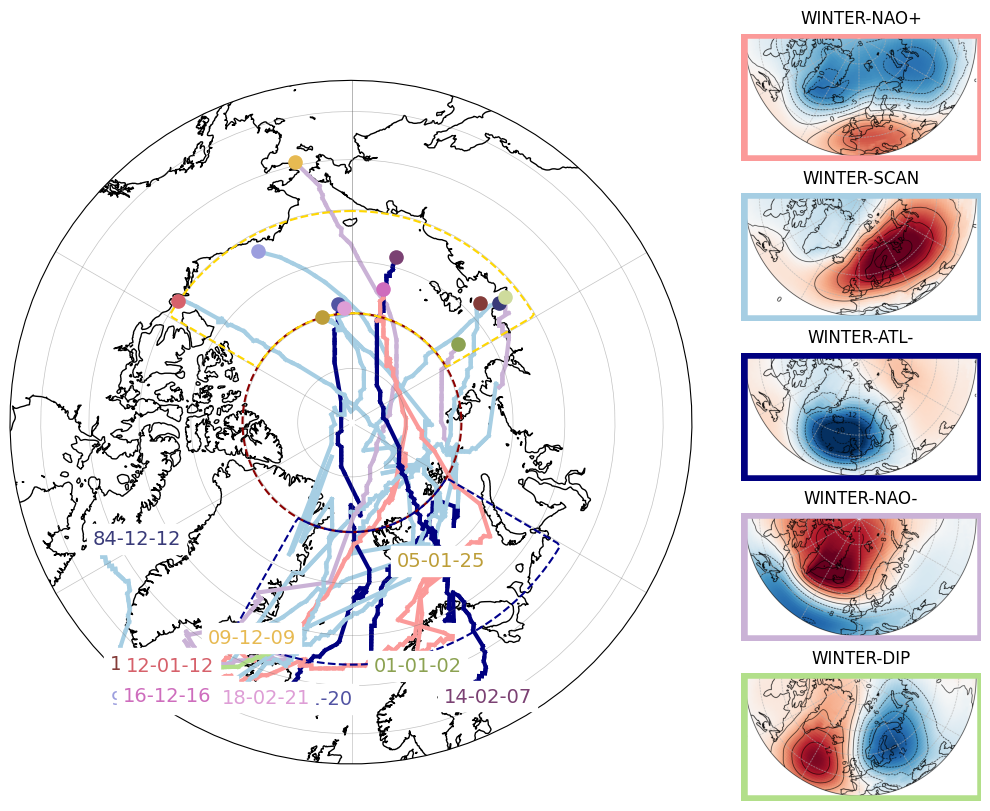

In [102]:
##ORIGINAL DO NOT CHANGE
fig,ax=plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(8,10))
objs_nr=len(objs_final[3:8])
# Define your regime colors
# 2. Choose a sequential colormap and sample it
cmap = cm.get_cmap("tab20b", len(objs_final))  # You can try "plasma", "cividis", etc.
obj_color_all = [cmap(i) for i in range(len(objs_final))]
atlantic_regimes = {
    'WINTER-NAO+': {'color': '#FB9A99', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_1_upper_half_horizontal.png'},
    'WINTER-SCAN': {'color': '#A6CEE3', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_2_upper_half_horizontal.png'},
    'WINTER-ATL-': {'color': 'navy', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_3_upper_half_horizontal.png'},
    'WINTER-NAO-': {'color': '#CAB2D6', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_4_upper_half_horizontal.png'},
    'WINTER-DIP': {'color': '#B2DF8A', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_5_upper_half_horizontal.png'}
}

for ii in range(len(objs_final)):
    cluster_values = objs_final[ii].clusters.values
    #print(cluster_values)
    track=objs_final[ii].track.values
    
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])    


    obj_id=objs_final[ii]['id_'].item()
    obj_color = obj_color_all[ii]
    #obj_color=df_objs[  df_objs['id'] == obj_id].color.item()
    #ax.text(track_lons[-1],track_lats[-1],obj_id,fontsize=14,backgroundcolor='white',transform=crs_rot,color=obj_color,zorder=11)
    ax.text(track_lons[0],track_lats[0],str(pd.to_datetime(objs_final[ii]['times'][0].values).strftime('%y-%m-%d')),fontsize=14,
            transform=crs_rot,color=obj_color,backgroundcolor='white',zorder=11) #color=obj_color
    #ax.scatter(track_lons[-1],track_lats[-1],facecolor='k',edgecolor='k',transform=crs_rot)
    ax.scatter(track_lons[-1],track_lats[-1],facecolor=obj_color,edgecolor=obj_color,transform=crs_rot,s=90,zorder =12)
    
    #ax.scatter(track_lons,track_lats,color=obj_color,transform=crs_rot)  
    #ax.plot(track_lons , track_lats ,color='k', transform = crs_rot,linewidth=3)

    for j in range(len(track_lats) - 1):
        #if np.isnan(cluster_values[j]):
        #    ax.plot(track_lons[j:j+2], track_lats[j:j+2], color='grey', transform=crs_rot, linewidth=2)
        #else:
        cluster_label = cluster_values[j]
        color = atlantic_regimes.get(cluster_label, {}).get('color', 'grey')
        ax.plot(track_lons[j:j+2], track_lats[j:j+2], color=color, transform=crs_rot, linewidth=3)

    
#duration_mean=np.array([len(obj.times) for obj in objs_final]).mean()
#this marks the domain (North Atlantic, Central Arctic and Beaufort area) 
for domain_name, domain_data in mask_domains.items():
    domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1.5,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())



#ax.text(0.02, 0.02, f'nr: {objs_nr}, duration: {int(np.round(duration_mean))}h',
#        transform=ax.transAxes, bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))
ax.coastlines()

ax.set_extent([-180,180, 60, 90], crs=ccrs.PlateCarree())
ax.gridlines(linewidth=0.5,color='dimgray',alpha=0.4,zorder=2)#,draw_labels=True)
#ax.set_title('ERA5 1979-2022',loc='left',y=1)
# Clip to circle
center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)


#fig.suptitle('IVT-Object tracks and associated synoptic pattern ERA5 1979-2022 in DJF', fontweight='bold',y=0.9)



# Add images as legend

image_positions = [0.67, 0.51, 0.35, 0.19, 0.03]  # Vertical
width = 0.3
height = 0.3

for i, (name, info) in enumerate(atlantic_regimes.items()):
    img = mpimg.imread(info['image'])
    
    #positions
    ax_img = fig.add_axes([1.0, image_positions[i], width, height])  #[left, bottom, width, height]
    ax_img.imshow(img)
    ax_img.axis('off')
    
    #Add frame and regime title
    rect = Rectangle((0, 0), 1.01, 1.01, linewidth=9, edgecolor=info['color'], facecolor='none', transform=ax_img.transAxes)
    ax_img.add_patch(rect)
    ax_img.text(0.5, 1.05, f'{name}', ha='center', va='bottom', fontsize=12, color='k', transform=ax_img.transAxes)


plt.savefig('/work/aa0049/a271122/ERA5/CirculationRegime_clusters/tracks_ERA5.png', bbox_inches='tight', dpi=300)
plt.show()

# ORIGINAL DO NOT CHANGE

In [103]:
df_atlantic_pacific_dates = df_atlantic_dates 

In [123]:
df_atlantic_pacific_dates['domain_pac']=df_pacific_dates['domain']
df_atlantic_pacific_dates['cluster_names_pac']=df_pacific_dates['cluster_names']

In [124]:
df_atlantic_pacific_dates

,year,month,day,hour,cluster,date,domain,cluster_names,domain_pac,cluster_names_pac,hemisphere
0,1979,1,1,6,5,1979-01-01 06:00:00,NONE,WINTER-DIP,NONE,PACIFIC TROUGH,NONE
1,1979,1,1,12,5,1979-01-01 12:00:00,NONE,WINTER-DIP,NONE,PACIFIC TROUGH,NONE
2,1979,1,1,18,5,1979-01-01 18:00:00,NONE,WINTER-DIP,NONE,PACIFIC TROUGH,NONE
3,1979,1,2,0,5,1979-01-02 00:00:00,NONE,WINTER-DIP,NONE,PACIFIC TROUGH,NONE
4,1979,1,2,6,5,1979-01-02 06:00:00,NONE,WINTER-DIP,NONE,PACIFIC TROUGH,NONE
...,...,...,...,...,...,...,...,...,...,...,...
15834,2022,12,30,18,3,2022-12-30 18:00:00,NONE,WINTER-ATL-,NONE,PACIFIC WAVE TRAIN,NONE
15835,2022,12,31,0,3,2022-12-31 00:00:00,NONE,WINTER-ATL-,NONE,PACIFIC WAVE TRAIN,NONE
15836,2022,12,31,6,3,2022-12-31 06:00:00,NONE,WINTER-ATL-,NONE,PACIFIC WAVE TRAIN,NONE
15837,2022,12,31,12,3,2022-12-31 12:00:00,NONE,WINTER-ATL-,NONE,PACIFIC WAVE TRAIN,NONE


In [125]:
# Ensure consistent datetime format
ATL_combined_times = pd.to_datetime(ATL_combined_times)
PC_combined_times = pd.to_datetime(PC_combined_times)

# Also ensure your df column is datetime
df_atlantic_pacific_dates['date'] = pd.to_datetime(df_atlantic_pacific_dates['date'])

# Now perform isin()
ATLA_bool = df_atlantic_pacific_dates['date'].isin(ATL_combined_times)
PC_bool = df_atlantic_pacific_dates['date'].isin(PC_combined_times)


In [126]:
conditions = [ATLA_bool,PC_bool]
choices = ['ATL', 'PC']

df_atlantic_pacific_dates['hemisphere'] = np.select(conditions, choices, default='NONE')
        

In [127]:
ATL_combined_times

DatetimeIndex(['1984-12-12 00:00:00', '1984-12-12 01:00:00',
               '1984-12-12 02:00:00', '1984-12-12 03:00:00',
               '1984-12-12 04:00:00', '1984-12-12 05:00:00',
               '1984-12-12 06:00:00', '1984-12-12 07:00:00',
               '1984-12-12 08:00:00', '1984-12-12 09:00:00',
               ...
               '2018-02-23 12:00:00', '2018-02-23 13:00:00',
               '2018-02-23 14:00:00', '2018-02-23 15:00:00',
               '2018-02-23 16:00:00', '2018-02-23 17:00:00',
               '2018-02-23 18:00:00', '2018-02-23 19:00:00',
               '2018-02-23 20:00:00', '2018-02-23 21:00:00'],
              dtype='datetime64[ns]', length=1226, freq=None)

In [128]:
PC_combined_times

DatetimeIndex(['1984-12-18 23:00:00', '1984-12-19 00:00:00',
               '1984-12-19 01:00:00', '1984-12-19 02:00:00',
               '1984-12-19 03:00:00', '1984-12-19 04:00:00',
               '1984-12-19 05:00:00', '1984-12-19 06:00:00',
               '1984-12-19 07:00:00', '1984-12-19 08:00:00',
               ...
               '2018-02-24 14:00:00', '2018-02-24 15:00:00',
               '2018-02-24 16:00:00', '2018-02-24 17:00:00',
               '2018-02-24 18:00:00', '2018-02-24 19:00:00',
               '2018-02-24 20:00:00', '2018-02-24 21:00:00',
               '2018-02-24 22:00:00', '2018-02-24 23:00:00'],
              dtype='datetime64[ns]', length=336, freq=None)

In [129]:
len(NA_combined_times) + 0.5*len(CA_combined_times)

770.0

In [130]:
len(BS_combined_times) + 0.5*len(CA_combined_times)

338.0

In [112]:
len(PC_combined_times)

336

In [113]:
len(ATL_combined_times)

1226

In [131]:
df_atlantic_pacific_dates

,year,month,day,hour,cluster,date,domain,cluster_names,domain_pac,cluster_names_pac,hemisphere
0,1979,1,1,6,5,1979-01-01 06:00:00,NONE,WINTER-DIP,NONE,PACIFIC TROUGH,NONE
1,1979,1,1,12,5,1979-01-01 12:00:00,NONE,WINTER-DIP,NONE,PACIFIC TROUGH,NONE
2,1979,1,1,18,5,1979-01-01 18:00:00,NONE,WINTER-DIP,NONE,PACIFIC TROUGH,NONE
3,1979,1,2,0,5,1979-01-02 00:00:00,NONE,WINTER-DIP,NONE,PACIFIC TROUGH,NONE
4,1979,1,2,6,5,1979-01-02 06:00:00,NONE,WINTER-DIP,NONE,PACIFIC TROUGH,NONE
...,...,...,...,...,...,...,...,...,...,...,...
15834,2022,12,30,18,3,2022-12-30 18:00:00,NONE,WINTER-ATL-,NONE,PACIFIC WAVE TRAIN,NONE
15835,2022,12,31,0,3,2022-12-31 00:00:00,NONE,WINTER-ATL-,NONE,PACIFIC WAVE TRAIN,NONE
15836,2022,12,31,6,3,2022-12-31 06:00:00,NONE,WINTER-ATL-,NONE,PACIFIC WAVE TRAIN,NONE
15837,2022,12,31,12,3,2022-12-31 12:00:00,NONE,WINTER-ATL-,NONE,PACIFIC WAVE TRAIN,NONE


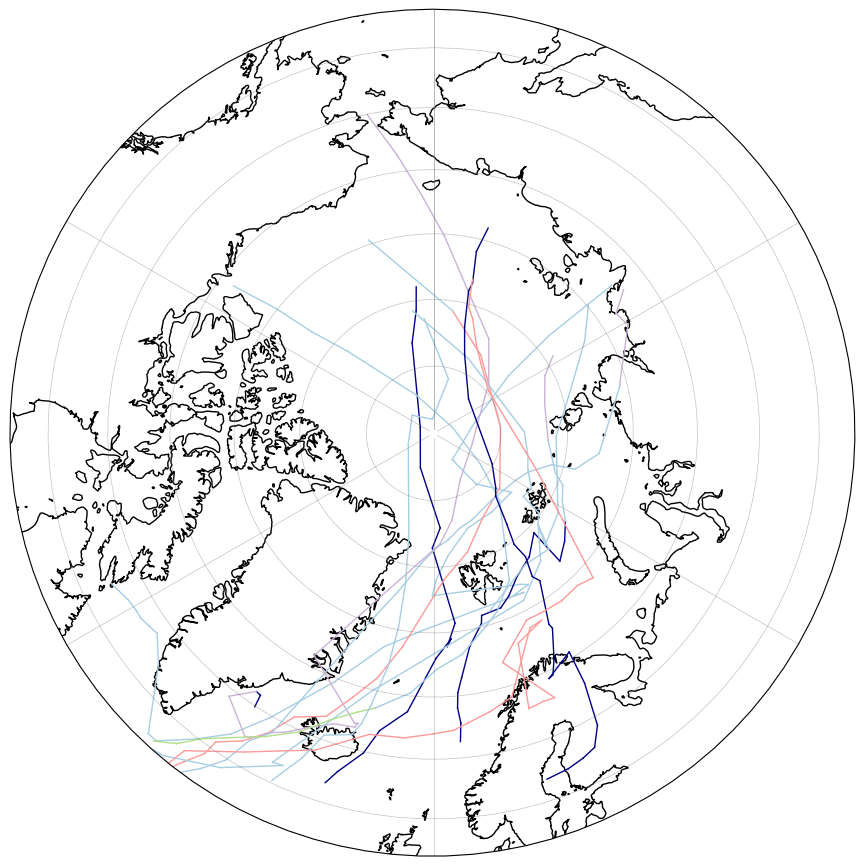

In [115]:
fig,ax=plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(10,10))

for i in range(len(objs_final)):
    track=objs_final[i].track.values
    cluster_values = objs_final[i].clusters.values
    
    
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])    
    for j in range(0, len(track_lats) - 6, 6):
        lat_start = track_lats[j]
        lon_start = track_lons[j]
        lat_end = track_lats[j + 6]
        lon_end = track_lons[j + 6]
    
        cluster_label = cluster_values[j]
        color = atlantic_regimes.get(cluster_label, {}).get('color', 'grey')
    
        ax.plot([lon_start, lon_end], [lat_start, lat_end], color=color,
                transform=crs_rot, linewidth=1)

ax.coastlines()

ax.set_extent([-180,180, 60, 90], crs=ccrs.PlateCarree())
ax.gridlines(linewidth=0.5,color='dimgray',alpha=0.4,zorder=2)#,draw_labels=True)
#ax.set_title('ERA5 1979-2022',loc='left',y=1)
# Clip to circle
center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)



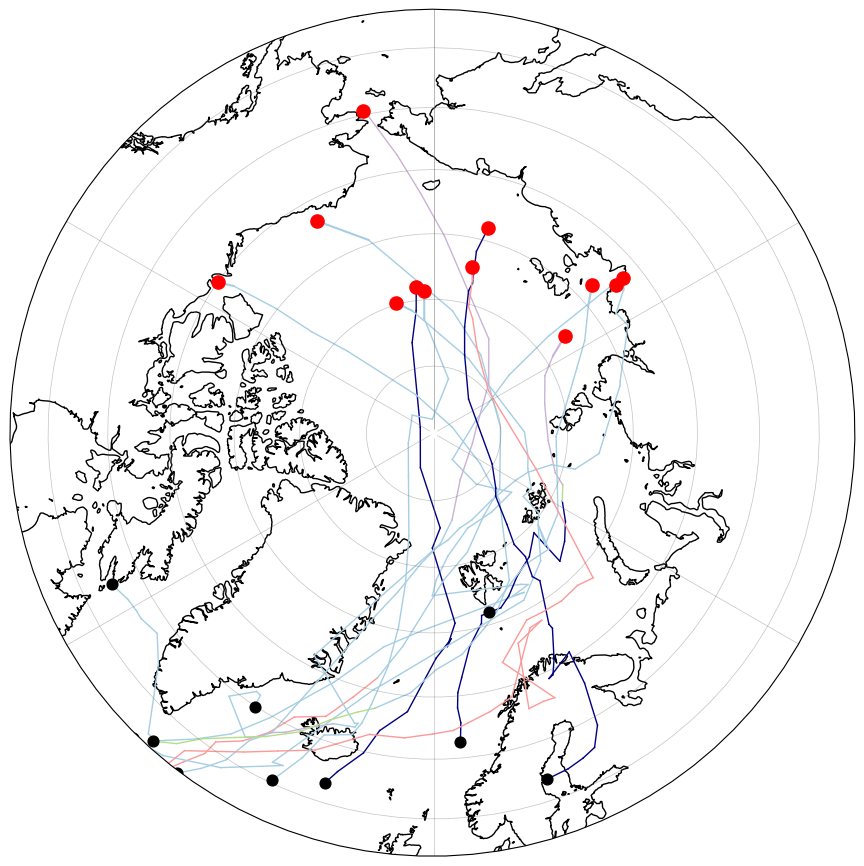

In [116]:
fig, ax = plt.subplots(1, 1, subplot_kw={'projection': ccrs.Orthographic(0, 90)}, figsize=(10, 10))

cluster_times = pd.DatetimeIndex(df_atlantic_pacific_dates['date'])

for obj in objs_final:
    track = obj.track.values
    times = pd.to_datetime(obj['times'].values)
    lats = np.array([p.lat for p in track])
    lons = np.array([p.lon for p in track])

    # Sample every 6th point for smoothness
    idxs = np.arange(0, len(times), 6)
    sampled_times = times[idxs]
    sampled_lats = lats[idxs]
    sampled_lons = lons[idxs]

    # Find nearest cluster time for each sampled time and get cluster names
    cluster_names = []
    for t in sampled_times:
        nearest_idx = cluster_times.get_indexer([t], method='nearest')[0]
        cluster_names.append(df_atlantic_pacific_dates.iloc[nearest_idx]['cluster_names'])

    # Plot cluster-colored segments connecting sampled points
    for j in range(len(sampled_lats) - 1):
        c = atlantic_regimes.get(cluster_names[j], {}).get('color', 'grey')
        ax.plot([sampled_lons[j], sampled_lons[j + 1]],
                [sampled_lats[j], sampled_lats[j + 1]],
                color=c, transform=crs_rot, linewidth=1)

    # Connect full track start/end to first/last sampled cluster points
    if len(sampled_lats) > 0:
        c_start = atlantic_regimes.get(cluster_names[0], {}).get('color', 'grey')
        ax.plot([lons[0], sampled_lons[0]], [lats[0], sampled_lats[0]],
                color=c_start, transform=crs_rot, linewidth=1.5, linestyle='-')

        c_end = atlantic_regimes.get(cluster_names[-1], {}).get('color', 'grey')
        ax.plot([lons[-1], sampled_lons[-1]], [lats[-1], sampled_lats[-1]],
                color=c_end, transform=crs_rot, linewidth=1.5, linestyle='-')

    # Scatter start/end points of full track
    ax.scatter(lons[0], lats[0], facecolor='black', edgecolor='black', transform=crs_rot, s=60, zorder=10)
    ax.scatter(lons[-1], lats[-1], facecolor='red', edgecolor='red', transform=crs_rot, s=90, zorder=11)

ax.coastlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
ax.gridlines(linewidth=0.5, color='dimgray', alpha=0.4, zorder=2)

center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

plt.show()


In [117]:
objs_final[1].times[0].values

numpy.datetime64('1990-01-20T21:00:00.000000000')

In [118]:
df_atlantic_pacific_dates[df_atlantic_pacific_dates['date']=='1990-01-21T00:00:00.000000000']

,year,month,day,hour,cluster,date,domain,cluster_names,domain_pac,cluster_names_pac,hemisphere
4039,1990,1,21,0,3,1990-01-21,NONE,WINTER-ATL-,NONE,Arctic Low,ATL


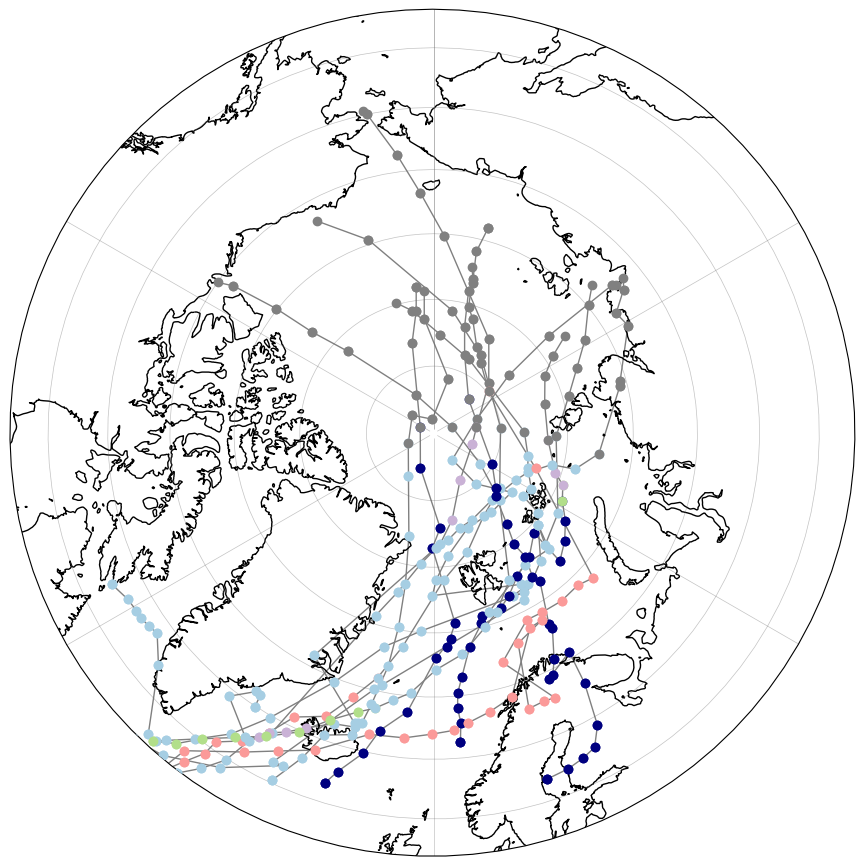

In [119]:
regimes = {
    'CL1':{'color':'rosybrown'},
    'CL2':{'color':'firebrick'},
    'CL3':{'color':'peru'},
    'CL4':{'color':'teal'},
    'CL5':{'color':'indigo'},
    'WINTER-NAO+':{'color': '#FB9A99'},
    'WINTER-SCAN':{'color': '#A6CEE3'},
    'WINTER-ATL-':{'color': 'navy'},
    'WINTER-NAO-':{'color': '#CAB2D6'},
    'WINTER-DIP':{'color': '#B2DF8A'}
}

fig, ax = plt.subplots(1, 1, subplot_kw={'projection': ccrs.Orthographic(0, 90)}, figsize=(10, 10))

cluster_times = pd.DatetimeIndex(df_atlantic_pacific_dates['date'])

for obj in objs_final:
    track = obj.track.values
    times = pd.to_datetime(obj['times'].values)
    lats = np.array([p.lat for p in track])
    lons = np.array([p.lon for p in track])

    # Sample every 6th point for smoothness
    idxs = np.arange(0, len(times), 6)
    sampled_times = times[idxs]
    sampled_lats = lats[idxs]
    sampled_lons = lons[idxs]

    # Find nearest cluster time for each sampled time and get cluster names
    cluster_names = []
    for t in sampled_times:
        nearest_idx = cluster_times.get_indexer([t], method='nearest')[0]
        
        if df_atlantic_pacific_dates.iloc[nearest_idx]['hemisphere']=='ATL':
            cluster_names.append(df_atlantic_pacific_dates.iloc[nearest_idx]['cluster_names'])
        elif df_atlantic_pacific_dates.iloc[nearest_idx]['hemisphere']=='PC':
            cluster_names.append(df_atlantic_pacific_dates.iloc[nearest_idx]['cluster_names_pac'])

    # Plot cluster-colored segments connecting sampled points
    for j in range(len(sampled_lats) - 1):
        c = regimes.get(cluster_names[j], {}).get('color', 'grey')
        ax.scatter([sampled_lons[j], sampled_lons[j + 1]],
                [sampled_lats[j], sampled_lats[j + 1]],
                color=c, transform=crs_rot, zorder=6)
        ax.plot([sampled_lons[j], sampled_lons[j + 1]],[sampled_lats[j], sampled_lats[j + 1]],color='grey', transform=crs_rot, linewidth=1,zorder=1)

    # Connect full track start/end to first/last sampled cluster points
    if len(sampled_lats) > 0:
        c_start = regimes.get(cluster_names[0], {}).get('color', 'grey')
        ax.scatter([lons[0], sampled_lons[0]], [lats[0], sampled_lats[0]],
                color=c_start, transform=crs_rot,zorder=5)
        ax.plot([lons[0], sampled_lons[0]], [lats[0], sampled_lats[0]],
                color='grey', transform=crs_rot, linewidth=1, linestyle='-',zorder=1)

        c_end = regimes.get(cluster_names[-1], {}).get('color', 'grey')
        ax.scatter([lons[-1], sampled_lons[-1]], [lats[-1], sampled_lats[-1]],
                color=c_end, transform=crs_rot,zorder=5)
        ax.plot([lons[-1], sampled_lons[-1]], [lats[-1], sampled_lats[-1]],
                color='grey', transform=crs_rot, linewidth=1, linestyle='-',zorder=1)

    # Scatter start/end points of full track
    #ax.scatter(lons[0], lats[0], facecolor='black', edgecolor='black', transform=crs_rot, s=60, zorder=10)
    #ax.scatter(lons[-1], lats[-1], facecolor='red', edgecolor='red', transform=crs_rot, s=90, zorder=11)
    


ax.coastlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
ax.gridlines(linewidth=0.5, color='dimgray', alpha=0.4, zorder=2)

center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

plt.show()


In [ ]:

CL1: PT        Pacific Trough
CL2: AH       Arctic High
CL3: AL        Arctic Low
CL4: PWT     Pacific wave train
CL5: ALR     Alaskan Ridge

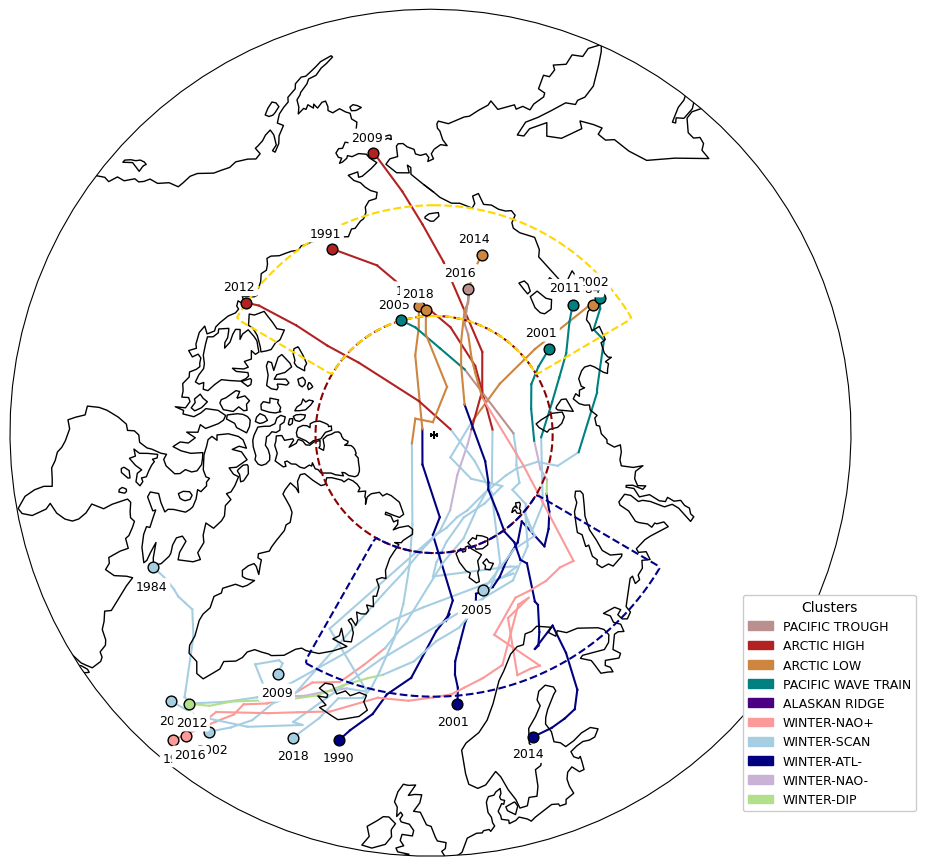

In [141]:
regimes = {
    'PACIFIC TROUGH':{'color':'rosybrown'},
    'ARCTIC HIGH':{'color':'firebrick'},
    'ARCTIC LOW':{'color':'peru'},
    'PACIFIC WAVE TRAIN':{'color':'teal'},
    'ALASKAN RIDGE':{'color':'indigo'},
    'WINTER-NAO+':{'color': '#FB9A99'},
    'WINTER-SCAN':{'color': '#A6CEE3'},
    'WINTER-ATL-':{'color': 'navy'},
    'WINTER-NAO-':{'color': '#CAB2D6'},
    'WINTER-DIP':{'color': '#B2DF8A'}
}

fig, ax = plt.subplots(1, 1, subplot_kw={'projection': ccrs.Orthographic(0, 90)}, figsize=(10, 10))

cluster_times = pd.DatetimeIndex(df_atlantic_pacific_dates['date'])

for obj in objs_final:
    track = obj.track.values
    times = pd.to_datetime(obj['times'].values)
    lats = np.array([p.lat for p in track])
    lons = np.array([p.lon for p in track])

    # Sample every 6th point for smoothness
    idxs = np.arange(0, len(times), 6)
    sampled_times = times[idxs]
    sampled_lats = lats[idxs]
    sampled_lons = lons[idxs]

    # Find nearest cluster time for each sampled time and get cluster names
    cluster_names = []
    for t in sampled_times:
        nearest_idx = cluster_times.get_indexer([t], method='nearest')[0]
        
        if df_atlantic_pacific_dates.iloc[nearest_idx]['hemisphere']=='ATL':
            cluster_names.append(df_atlantic_pacific_dates.iloc[nearest_idx]['cluster_names'])
        elif df_atlantic_pacific_dates.iloc[nearest_idx]['hemisphere']=='PC':
            cluster_names.append(df_atlantic_pacific_dates.iloc[nearest_idx]['cluster_names_pac'])

    # Plot cluster-colored segments connecting sampled points
    for j in range(len(sampled_lats) - 1):
        c = regimes.get(cluster_names[j], {}).get('color', 'grey')
        #ax.scatter([sampled_lons[j], sampled_lons[j + 1]],[sampled_lats[j], sampled_lats[j + 1]],color=c, transform=crs_rot, zorder=6)
        ax.plot([sampled_lons[j], sampled_lons[j + 1]],[sampled_lats[j], sampled_lats[j + 1]],color=c, transform=crs_rot, linewidth=1.5,zorder=1)

    # Connect full track start/end to first/last sampled cluster points
    if len(sampled_lats) > 0:
        c_start = regimes.get(cluster_names[0], {}).get('color', 'grey')
        #ax.scatter([lons[0], sampled_lons[0]], [lats[0], sampled_lats[0]],color=c_start, transform=crs_rot,zorder=5)
        ax.plot([lons[0], sampled_lons[0]], [lats[0], sampled_lats[0]],
                color=c_start, transform=crs_rot, linewidth=1.5, linestyle='-',zorder=1)

        c_end = regimes.get(cluster_names[-1], {}).get('color', 'grey')
        #ax.scatter([lons[-1], sampled_lons[-1]], [lats[-1], sampled_lats[-1]],color=c_end, transform=crs_rot,zorder=5)
        ax.plot([lons[-1], sampled_lons[-1]], [lats[-1], sampled_lats[-1]],
                color=c_end, transform=crs_rot, linewidth=1.5, linestyle='-',zorder=1)
        
        
        #Add years as text
        ax.text(lons[-1]+2,lats[-1]-1.1,str(pd.to_datetime(obj.times[0].values).strftime('%Y')),fontsize=9,
            transform=crs_rot,bbox=dict(facecolor='white',edgecolor='none',boxstyle='round,pad=0.2'),zorder=12) #color=obj_color
        
        ax.text(lons[0]+2,lats[0]+2,str(pd.to_datetime(obj.times[0].values).strftime('%Y')),fontsize=9,
        transform=crs_rot,bbox=dict(facecolor='white',edgecolor='none',boxstyle='round,pad=0.2'),zorder=12)

    # Scatter start/end points of full track
        ax.scatter(lons[0], lats[0], facecolor=c_start, edgecolor='black', transform=crs_rot, s=60, zorder=10)
        ax.scatter(lons[-1], lats[-1], facecolor=c_end, edgecolor='black', transform=crs_rot, s=60, zorder=11)
    


ax.coastlines()
ax.set_extent([-180, 180, 55, 90], crs=ccrs.PlateCarree())
#ax.gridlines(linewidth=0.5, color='dimgray', alpha=0.4, zorder=2)

center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

for domain_name, domain_data in mask_domains.items():
    domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1.5,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())


from matplotlib.patches import Patch

# Create legend handles
legend_elements = [Patch(facecolor=regimes[k]['color'], edgecolor=regimes[k]['color'], label=k) for k in regimes]

# Add legend to plot
legend = ax.legend(handles=legend_elements,
                   loc='lower left',
                   fontsize=9,
                   frameon=True,
                   title='Clusters',
                   title_fontsize=10,
                   bbox_to_anchor=(0.9, 0))
legend.get_frame().set_alpha(1)

# Draw horizontal line
ax.scatter(0,0,marker='+',color='k')#,markersize=8)


plt.savefig('/work/aa0049/a271122/scripts/ERA5/atlantic_pacific_circulation_regimes.png',dpi=300)

plt.show()


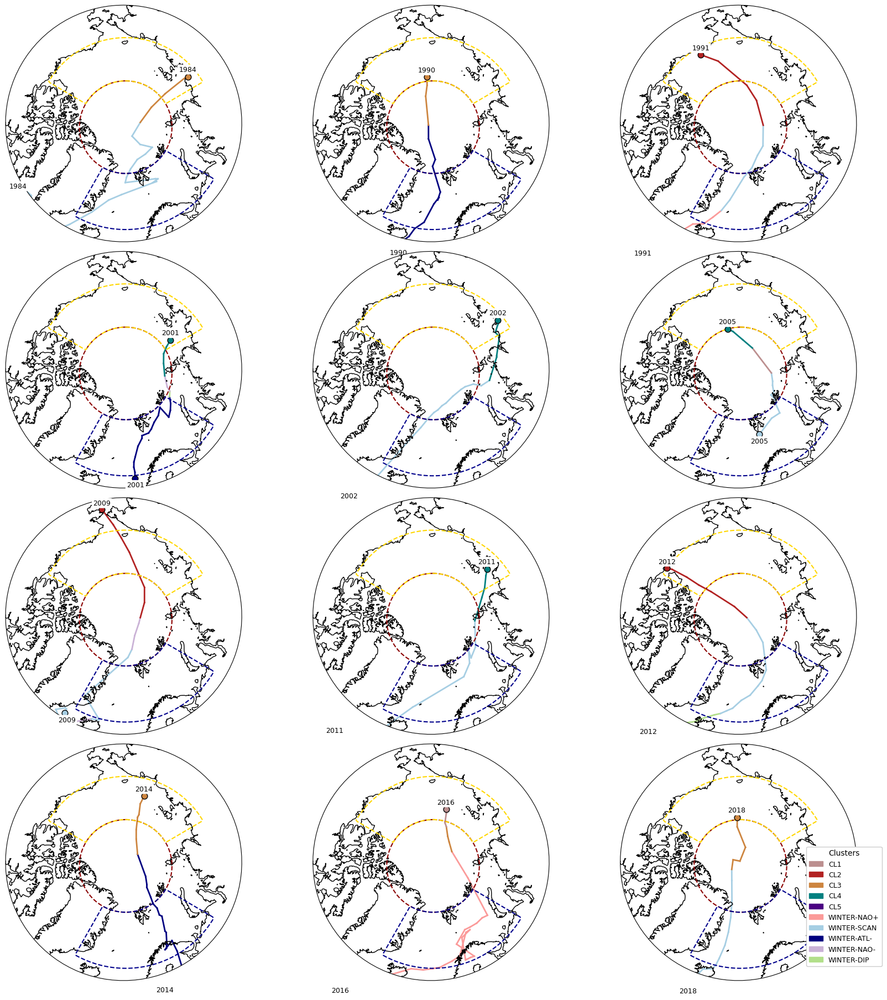

In [97]:
fig, axs = plt.subplots(4, 3, subplot_kw={'projection': ccrs.Orthographic(0, 90)}, figsize=(18, 18))
axs = axs.flatten()

cluster_times = pd.DatetimeIndex(df_atlantic_pacific_dates['date'])

for ii, ax in enumerate(axs[:len(objs_final)]): 
    obj = objs_final[ii]
    track = obj.track.values
    times = pd.to_datetime(obj['times'].values)
    lats = np.array([p.lat for p in track])
    lons = np.array([p.lon for p in track])
    obj_id = obj['id_'].item()

    # Sample every 6th point
    idxs = np.arange(0, len(times), 6)
    sampled_times = times[idxs]
    sampled_lats = lats[idxs]
    sampled_lons = lons[idxs]

    # Determine cluster regimes at sampled times
    cluster_names = []
    for t in sampled_times:
        nearest_idx = cluster_times.get_indexer([t], method='nearest')[0]
        if df_atlantic_pacific_dates.iloc[nearest_idx]['hemisphere'] == 'ATL':
            cluster_names.append(df_atlantic_pacific_dates.iloc[nearest_idx]['cluster_names'])
        elif df_atlantic_pacific_dates.iloc[nearest_idx]['hemisphere'] == 'PC':
            cluster_names.append(df_atlantic_pacific_dates.iloc[nearest_idx]['cluster_names_pac'])

    # Plot colored segments by regime
    for j in range(len(sampled_lats) - 1):
        c = regimes.get(cluster_names[j], {}).get('color', 'grey')
        ax.plot([sampled_lons[j], sampled_lons[j + 1]], [sampled_lats[j], sampled_lats[j + 1]],
                color=c, transform=crs_rot, linewidth=2, zorder=1)

    # Connect full track start/end to sampled clusters
    if len(sampled_lats) > 0:
        c_start = regimes.get(cluster_names[0], {}).get('color', 'grey')
        c_end = regimes.get(cluster_names[-1], {}).get('color', 'grey')

        ax.plot([lons[0], sampled_lons[0]], [lats[0], sampled_lats[0]],
                color=c_start, transform=crs_rot, linewidth=2, linestyle='-', zorder=1)
        ax.plot([lons[-1], sampled_lons[-1]], [lats[-1], sampled_lats[-1]],
                color=c_end, transform=crs_rot, linewidth=2, linestyle='-', zorder=1)

        # Start/End points
        ax.scatter(lons[0], lats[0], facecolor=c_start, edgecolor='black',
                   transform=crs_rot, s=60, zorder=10)
        ax.scatter(lons[-1], lats[-1], facecolor=c_end, edgecolor='black',
                   transform=crs_rot, s=60, zorder=11)

        # Year annotation
        ax.text(lons[-1]+2, lats[-1]-1.1, pd.to_datetime(obj['times'][0].values).strftime('%Y'),
                fontsize=9, transform=crs_rot,
                bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.2'), zorder=12)
        ax.text(lons[0]+2, lats[0]+2, pd.to_datetime(obj['times'][0].values).strftime('%Y'),
                fontsize=9, transform=crs_rot,
                bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.2'), zorder=12)

    # Coastlines and boundaries
    ax.coastlines()
    ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    ax.set_title(f"{pd.to_datetime(obj['times'][0].values).strftime('%Y-%m-%d')}, ID: {str(obj_id)}", y=1.1)

    # Polar boundary circle
    center, radius = [0.5, 0.5], 0.55
    circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), 
                                   np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    # Domain outlines
    for domain_name, domain_data in mask_domains.items():
        domain_data["mask"].plot.contour(levels=1, colors=domain_data["color"],
                                         linewidths=1.5, linestyles='--',
                                         zorder=4, ax=ax, transform=ccrs.PlateCarree())

# Optional: Legend (put on last axis or use fig-wide)
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=regimes[k]['color'], edgecolor=regimes[k]['color'], label=k) for k in regimes]
legend = axs[-1].legend(handles=legend_elements,
                        loc='lower left', fontsize=9, frameon=True,
                        title='Clusters', title_fontsize=10, bbox_to_anchor=(0.8, 0))
legend.get_frame().set_alpha(1)

# Final layout
plt.tight_layout(pad=0.9, h_pad=0.33, w_pad=0.01)
plt.show()


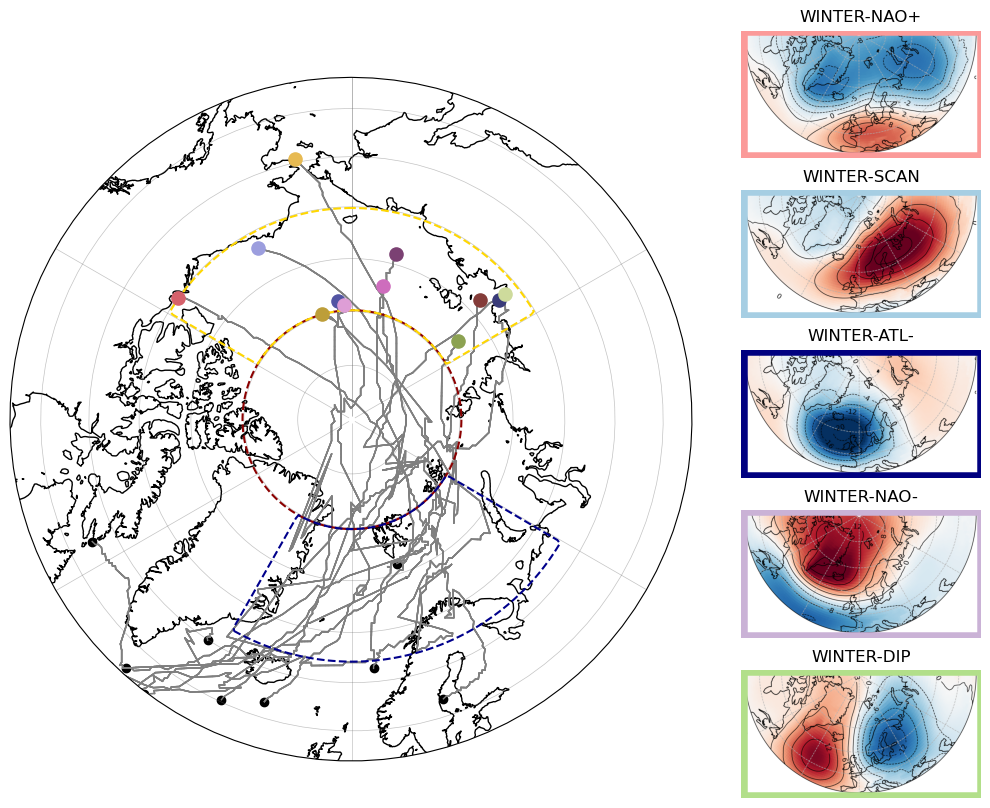

In [98]:
##ORIGINAL DO NOT CHANGE
fig,ax=plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(8,10))
objs_nr=len(objs_final[3:8])
# Define your regime colors
# 2. Choose a sequential colormap and sample it
cmap = cm.get_cmap("tab20b", len(objs_final))  # You can try "plasma", "cividis", etc.
obj_color_all = [cmap(i) for i in range(len(objs_final))]
atlantic_regimes = {
    'WINTER-NAO+': {'color': '#FB9A99', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_1_upper_half_horizontal.png'},  
    'WINTER-SCAN': {'color': '#A6CEE3', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_2_upper_half_horizontal.png'},
    'WINTER-ATL-': {'color': 'navy', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_3_upper_half_horizontal.png'},
    'WINTER-NAO-': {'color': '#CAB2D6', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_4_upper_half_horizontal.png'},
    'WINTER-DIP': {'color': '#B2DF8A', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_5_upper_half_horizontal.png'}
}

for ii in range(len(objs_final)):
    cluster_values = objs_final[ii].clusters.values
    #print(cluster_values)
    track=objs_final[ii].track.values
    
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])    


    obj_id=objs_final[ii]['id_'].item()
    obj_color = obj_color_all[ii]
    #obj_color=df_objs[  df_objs['id'] == obj_id].color.item()
    #ax.text(track_lons[-1],track_lats[-1],obj_id,fontsize=14,backgroundcolor='white',transform=crs_rot,color=obj_color,zorder=11)
    #ax.text(track_lons[0],track_lats[0],str(pd.to_datetime(objs_final[ii]['times'][0].values).strftime('%y-%m-%d')),fontsize=14,
    #        transform=crs_rot,color=obj_color,backgroundcolor='white',zorder=11) #color=obj_color
    ax.scatter(track_lons[0],track_lats[0],facecolor='k',edgecolor='k',transform=crs_rot)
    ax.scatter(track_lons[-1],track_lats[-1],facecolor=obj_color,edgecolor=obj_color,transform=crs_rot,s=90,zorder =12)
    
    #ax.scatter(track_lons,track_lats,color=obj_color,transform=crs_rot)  
    #ax.plot(track_lons , track_lats ,color='k', transform = crs_rot,linewidth=3)

    for j in range(len(track_lats) - 1):
        #if np.isnan(cluster_values[j]):
        #    ax.plot(track_lons[j:j+2], track_lats[j:j+2], color='grey', transform=crs_rot, linewidth=2)
        #else:
        cluster_label = cluster_values[j]
        color = atlantic_regimes.get(cluster_label, {}).get('color', 'grey')
        ax.plot(track_lons[j:j+2], track_lats[j:j+2], color='grey', transform=crs_rot, linewidth=1)

    
#duration_mean=np.array([len(obj.times) for obj in objs_final]).mean()
#this marks the domain (North Atlantic, Central Arctic and Beaufort area) 
for domain_name, domain_data in mask_domains.items():
    domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1.5,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())



#ax.text(0.02, 0.02, f'nr: {objs_nr}, duration: {int(np.round(duration_mean))}h',
#        transform=ax.transAxes, bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))
ax.coastlines()

ax.set_extent([-180,180, 60, 90], crs=ccrs.PlateCarree())
ax.gridlines(linewidth=0.5,color='dimgray',alpha=0.4,zorder=2)#,draw_labels=True)
#ax.set_title('ERA5 1979-2022',loc='left',y=1)
# Clip to circle
center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)


#fig.suptitle('IVT-Object tracks and associated synoptic pattern ERA5 1979-2022 in DJF', fontweight='bold',y=0.9)



# Add images as legend

image_positions = [0.67, 0.51, 0.35, 0.19, 0.03]  # Vertical
width = 0.3
height = 0.3

for i, (name, info) in enumerate(atlantic_regimes.items()):
    img = mpimg.imread(info['image'])
    
    #positions
    ax_img = fig.add_axes([1.0, image_positions[i], width, height])  #[left, bottom, width, height]
    ax_img.imshow(img)
    ax_img.axis('off')
    
    #Add frame and regime title
    rect = Rectangle((0, 0), 1.01, 1.01, linewidth=9, edgecolor=info['color'], facecolor='none', transform=ax_img.transAxes)
    ax_img.add_patch(rect)
    ax_img.text(0.5, 1.05, f'{name}', ha='center', va='bottom', fontsize=12, color='k', transform=ax_img.transAxes)


plt.savefig('/work/aa0049/a271122/ERA5/CirculationRegime_clusters/tracks_ERA5.png', bbox_inches='tight', dpi=300)
plt.show()

# ORIGINAL DO NOT CHANGE

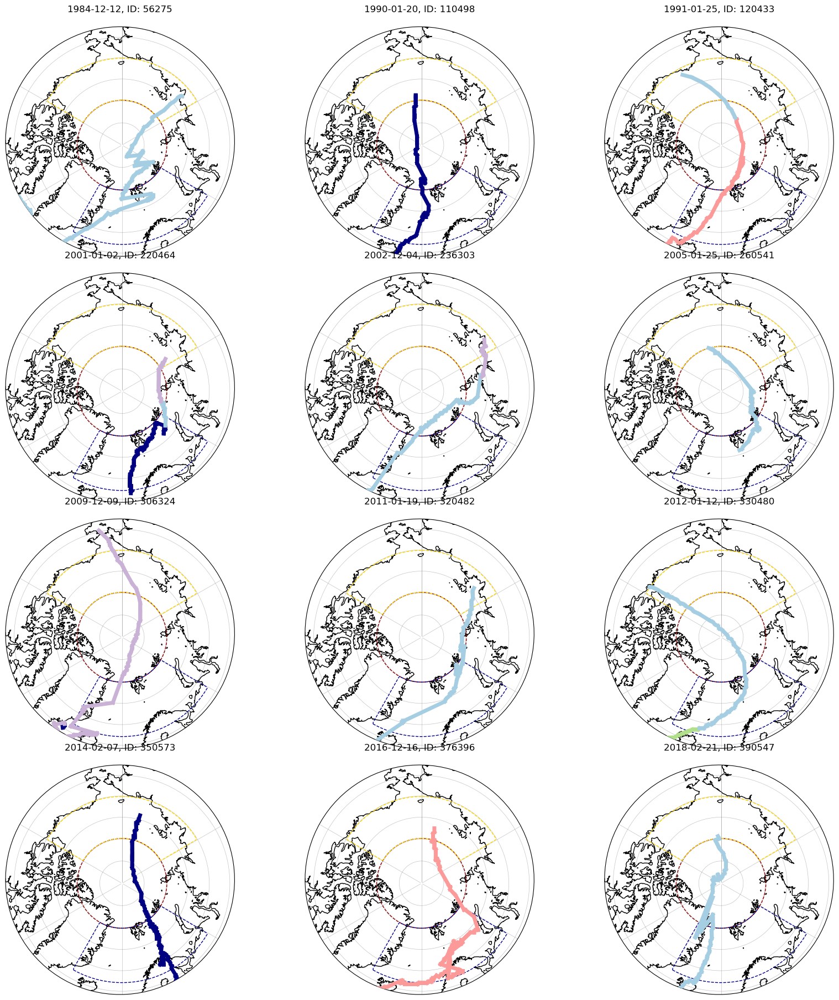

In [63]:

fig, axs = plt.subplots(4, 3, subplot_kw={'projection': ccrs.Orthographic(0, 90)}, figsize=(18,18))
axs = axs.flatten()  #Flatten so there won't be problems with the for loop

plt.subplots_adjust(hspace=0.29, wspace=0.01)
 
for ii, ax in enumerate(axs[:len(objs_final)]): 

    obj = objs_final[ii]
    track = objs_final[ii].track.values
    cluster_values = obj.clusters.values
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])
    obj_color = 'tab:blue'

    
    #Plot full track
    obj_id = objs_final[ii]['id_'].item()
    #obj_color = df_objs_[df_objs_['id'] == obj_id].color.item()
    
    # Plot track segments with cluster color
    for j in range(len(track_lats) - 1):
        cluster_label = cluster_values[j]
        color = atlantic_regimes.get(cluster_label, {}).get('color', 'grey')
        ax.plot(track_lons[j:j+2], track_lats[j:j+2], color=color,
                transform=crs_rot, linewidth=5,zorder=11)

    # Optional: draw domain outlines
    for domain_name, domain_data in mask_domains.items():
        domain_data["mask"].plot.contour(levels=1, colors=domain_data["color"],
                                         linewidths=1, linestyles='--', zorder=4,
                                         ax=ax, transform=ccrs.PlateCarree())

    
    #Format
    ax.coastlines()
    ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    ax.gridlines(linewidth=0.5, color='dimgray', alpha=0.4, zorder=2)
    ax.set_title(f"{pd.to_datetime(obj['times'][0].values).strftime('%Y-%m-%d')}, ID: {str(obj_id)}",y=1.1)
    
    center, radius = [0.5, 0.5], 0.55
    circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), 
                                   np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

plt.tight_layout(pad=0.9,h_pad=0.33, w_pad=0.01)
#plt.savefig('ivt_tracks_12subplots.png', dpi=300, bbox_inches='tight')
plt.show()


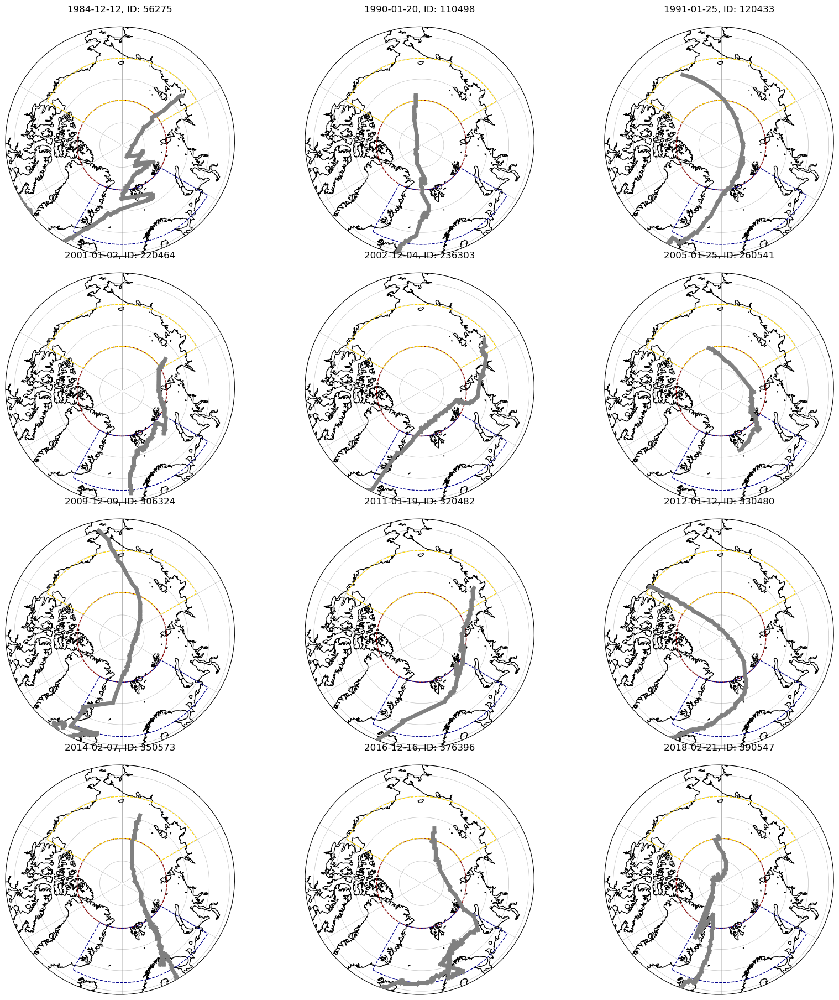

In [65]:

fig, axs = plt.subplots(4, 3, subplot_kw={'projection': ccrs.Orthographic(0, 90)}, figsize=(18,18))
axs = axs.flatten()  #Flatten so there won't be problems with the for loop

plt.subplots_adjust(hspace=0.29, wspace=0.01)


for ii, ax in enumerate(axs[:len(objs_final)]): 

    obj = objs_final[ii]
    track = objs_final[ii].track.values
    cluster_values = obj.clusters.values
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])
    obj_color = 'tab:blue'

    
    #Plot full track
    obj_id = objs_final[ii]['id_'].item()
    #obj_color = df_objs_[df_objs_['id'] == obj_id].color.item()
    
    # Plot track segments with cluster color
    for j in range(len(track_lats) - 1):
        cluster_label = cluster_values[j]
        color = pacific_regimes.get(cluster_label, {}).get('color', 'grey')
        ax.plot(track_lons[j:j+2], track_lats[j:j+2], color=color,
                transform=crs_rot, linewidth=5,zorder=11)

    # Optional: draw domain outlines
    for domain_name, domain_data in mask_domains.items():
        domain_data["mask"].plot.contour(levels=1, colors=domain_data["color"],
                                         linewidths=1, linestyles='--', zorder=4,
                                         ax=ax, transform=ccrs.PlateCarree())

    
    #Format
    ax.coastlines()
    ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    ax.gridlines(linewidth=0.5, color='dimgray', alpha=0.4, zorder=2)
    ax.set_title(f"{pd.to_datetime(obj['times'][0].values).strftime('%Y-%m-%d')}, ID: {str(obj_id)}",y=1.1)
    
    center, radius = [0.5, 0.5], 0.55
    circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), 
                                   np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

plt.tight_layout(pad=0.9,h_pad=0.33, w_pad=0.01)
#plt.savefig('ivt_tracks_12subplots.png', dpi=300, bbox_inches='tight')
plt.show()


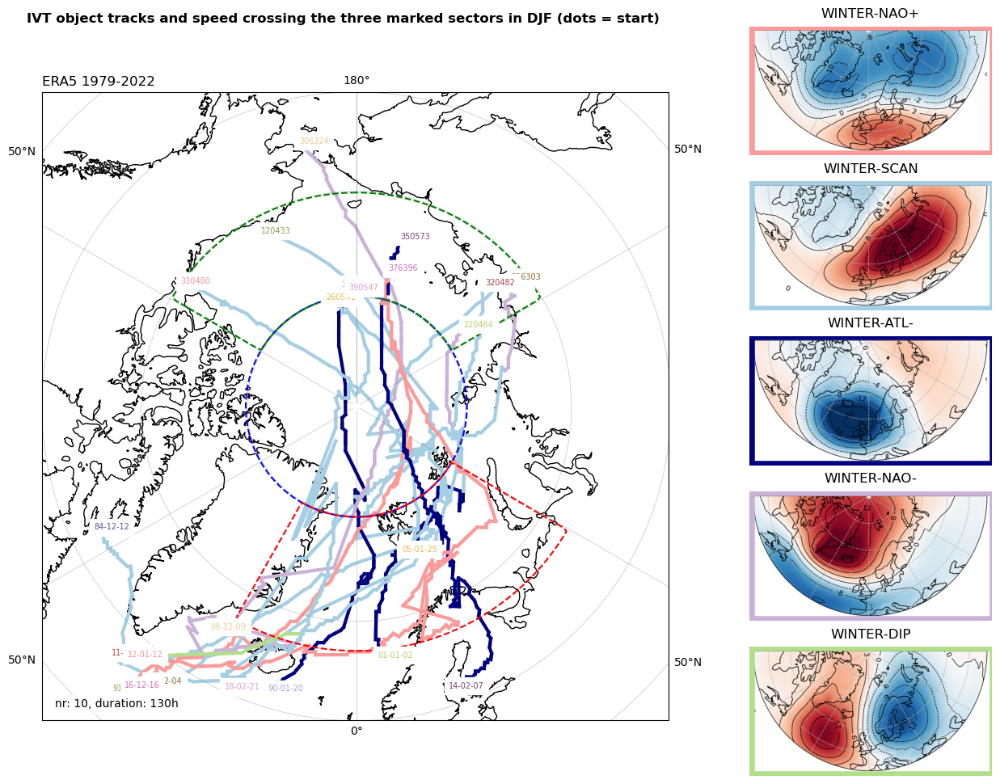

In [181]:
fig,ax=plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(10,12))
objs_nr=len(objs_final[1:11])
# Define your regime colors
# 2. Choose a sequential colormap and sample it
cmap = cm.get_cmap("tab20b", len(objs_final))  # You can try "plasma", "cividis", etc.
obj_color_all = [cmap(i) for i in range(len(objs_final))]
atlantic_regimes = {
    'WINTER-NAO+': {'color': '#FB9A99', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_1_upper_half_horizontal.png'},
    'WINTER-SCAN': {'color': '#A6CEE3', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_2_upper_half_horizontal.png'},
    'WINTER-ATL-': {'color': 'navy', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_3_upper_half_horizontal.png'},
    'WINTER-NAO-': {'color': '#CAB2D6', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_4_upper_half_horizontal.png'},
    'WINTER-DIP': {'color': '#B2DF8A', 'image': f'{arctic_cluster_path}/regime_images/djf_atlantic_cluster_5_upper_half_horizontal.png'}
}

#Define regime colors and images in dictionary
pacific_regimes = {
    '1': {'name':'cl1','color': '#FDBF6F', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_1_upper_half_horizontal.png'},
    '2': {'name':'cl2','color': '#FF7F00', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_2_upper_half_horizontal.png'},
    '3': {'name':'cl3','color': '#1F78B4', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_3_upper_half_horizontal.png'},
    '4': {'name':'cl4','color': '#33A02C', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_4_upper_half_horizontal.png'},
    '5': {'name':'cl5','color': '#6A3D9A', 'image': f'{arctic_cluster_path}/regime_images/djf_pacific_cluster_5_upper_half_horizontal.png'}
}
#['#FDBF6F', '#FF7F00', '#1F78B4', '#33A02C', '#6A3D9A']

for ii in range(1,13):
    cluster_values = objs_final[ii].clusters.values
    #print(cluster_values)
    track=objs_final[ii].track.values
    
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])    


    obj_id=objs_final[ii]['id_'].item()
    obj_color = obj_color_all[ii]
    #obj_color=df_objs[  df_objs['id'] == obj_id].color.item()
    ax.text(track_lons[-1],track_lats[-1],obj_id,fontsize=7,backgroundcolor='white',transform=crs_rot,color=obj_color,zorder=11)
    ax.text(track_lons[0],track_lats[0],str(pd.to_datetime(objs_final[ii]['times'][0].values).strftime('%y-%m-%d')),fontsize=7,transform=crs_rot,color=obj_color,backgroundcolor='white',zorder=11)
    ax.scatter(track_lons[-1],track_lats[-1],facecolor=obj_color,edgecolor=obj_color,transform=crs_rot)
    ax.scatter(track_lons[0],track_lats[0],facecolor=obj_color,edgecolor=obj_color,transform=crs_rot)
    #ax.scatter(track_lons,track_lats,color=obj_color,transform=crs_rot)  
    #ax.plot(track_lons , track_lats ,color='k', transform = crs_rot,linewidth=3)

    for j in range(len(track_lats) - 1):
        #if np.isnan(cluster_values[j]):
        #    ax.plot(track_lons[j:j+2], track_lats[j:j+2], color='grey', transform=crs_rot, linewidth=2)
        #else:
        cluster_label = cluster_values[j]
        color = atlantic_regimes.get(cluster_label, {}).get('color', 'grey')
        ax.plot(track_lons[j:j+2], track_lats[j:j+2], color=color, transform=crs_rot, linewidth=3)

    
duration_mean=np.array([len(obj.times) for obj in objs_final]).mean()
#this marks the domain (North Atlantic, Central Arctic and Beaufort area) 
for domain_name, domain_data in mask_domains.items():
    domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1.5,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())



ax.text(0.02, 0.02, f'nr: {objs_nr}, duration: {int(np.round(duration_mean))}h',
        transform=ax.transAxes, bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))
ax.coastlines()
ax.set_extent([-180,180, 60, 90], crs=ccrs.PlateCarree())
ax.gridlines(linewidth=0.5,color='dimgray',alpha=0.4,zorder=2,draw_labels=True)
ax.set_title('ERA5 1979-2022',loc='left',y=1)
fig.suptitle('IVT object tracks and speed crossing the three marked sectors in DJF (dots = start) ', fontweight='bold',y=0.9)



# Add images as legend


plt.show()

# grey represents the outliers

In [77]:
len(objs_final[0].clusters)

124

In [92]:
objs_final[0].times

<xarray.DataArray 'times' (times: 124)>
array(['1983-02-25T02:00:00.000000000', '1983-02-25T03:00:00.000000000',
       '1983-02-25T04:00:00.000000000', '1983-02-25T05:00:00.000000000',
       '1983-02-25T06:00:00.000000000', '1983-02-25T07:00:00.000000000',
       '1983-02-25T08:00:00.000000000', '1983-02-25T09:00:00.000000000',
       '1983-02-25T10:00:00.000000000', '1983-02-25T11:00:00.000000000',
       '1983-02-25T12:00:00.000000000', '1983-02-25T13:00:00.000000000',
       '1983-02-25T14:00:00.000000000', '1983-02-25T15:00:00.000000000',
       '1983-02-25T16:00:00.000000000', '1983-02-25T17:00:00.000000000',
       '1983-02-25T18:00:00.000000000', '1983-02-25T19:00:00.000000000',
       '1983-02-25T20:00:00.000000000', '1983-02-25T21:00:00.000000000',
       '1983-02-25T22:00:00.000000000', '1983-02-25T23:00:00.000000000',
       '1983-02-26T00:00:00.000000000', '1983-02-26T01:00:00.000000000',
       '1983-02-26T02:00:00.000000000', '1983-02-26T03:00:00.000000000',
       '1983-02-26T04:00:00.000000000', '1983-02-26T05:00:00.000000000',
       '1983-02-26T06:00:00.000000000', '1983-02-26T07:00:00.000000000',
       '1983-02-26T08:00:00.000000000', '1983-02-26T09:00:00.000000000',
       '1983-02-26T10:00:00.000000000', '1983-02-26T11:00:00.000000000',
       '1983-02-26T12:00:00.000000000', '1983-02-26T13:00:00.000000000',
       '1983-02-26T14:00:00.000000000', '1983-02-26T15:00:00.000000000',
       '1983-02-26T16:00:00.000000000', '1983-02-26T17:00:00.000000000',
       '1983-02-26T18:00:00.000000000', '1983-02-26T19:00:00.000000000',
       '1983-02-26T20:00:00.000000000', '1983-02-26T21:00:00.000000000',
       '1983-02-26T22:00:00.000000000', '1983-02-26T23:00:00.000000000',
       '1983-02-27T00:00:00.000000000', '1983-02-27T01:00:00.000000000',
       '1983-02-27T02:00:00.000000000', '1983-02-27T03:00:00.000000000',
       '1983-02-27T04:00:00.000000000', '1983-02-27T05:00:00.000000000',
       '1983-02-27T06:00:00.000000000', '1983-02-27T07:00:00.000000000',
       '1983-02-27T08:00:00.000000000', '1983-02-27T09:00:00.000000000',
       '1983-02-27T10:00:00.000000000', '1983-02-27T11:00:00.000000000',
       '1983-02-27T12:00:00.000000000', '1983-02-27T13:00:00.000000000',
       '1983-02-27T14:00:00.000000000', '1983-02-27T15:00:00.000000000',
       '1983-02-27T16:00:00.000000000', '1983-02-27T17:00:00.000000000',
       '1983-02-27T18:00:00.000000000', '1983-02-27T19:00:00.000000000',
       '1983-02-27T20:00:00.000000000', '1983-02-27T21:00:00.000000000',
       '1983-02-27T22:00:00.000000000', '1983-02-27T23:00:00.000000000',
       '1983-02-28T00:00:00.000000000', '1983-02-28T01:00:00.000000000',
       '1983-02-28T02:00:00.000000000', '1983-02-28T03:00:00.000000000',
       '1983-02-28T04:00:00.000000000', '1983-02-28T05:00:00.000000000',
       '1983-02-28T06:00:00.000000000', '1983-02-28T07:00:00.000000000',
       '1983-02-28T08:00:00.000000000', '1983-02-28T09:00:00.000000000',
       '1983-02-28T10:00:00.000000000', '1983-02-28T11:00:00.000000000',
       '1983-02-28T12:00:00.000000000', '1983-02-28T13:00:00.000000000',
       '1983-02-28T14:00:00.000000000', '1983-02-28T15:00:00.000000000',
       '1983-02-28T16:00:00.000000000', '1983-02-28T17:00:00.000000000',
       '1983-02-28T18:00:00.000000000', '1983-02-28T19:00:00.000000000',
       '1983-02-28T20:00:00.000000000', '1983-02-28T21:00:00.000000000',
       '1983-02-28T22:00:00.000000000', '1983-02-28T23:00:00.000000000',
       '1983-03-01T00:00:00.000000000', '1983-03-01T01:00:00.000000000',
       '1983-03-01T02:00:00.000000000', '1983-03-01T03:00:00.000000000',
       '1983-03-01T04:00:00.000000000', '1983-03-01T05:00:00.000000000',
       '1983-03-01T06:00:00.000000000', '1983-03-01T07:00:00.000000000',
       '1983-03-01T08:00:00.000000000', '1983-03-01T09:00:00.000000000',
       '1983-03-01T10:00:00.000000000', '1983-03-01T11:00:00.000000000',
       '1983-03-01T12:00:00.000000000', '1983-03-01T13:00:00.000000000',
       '1983-03-01